# CIS6800: Project 3: SOLO and FPN (Instance Segmentation)
### Due:
* Part (a) Oct. 1 at 11:59 p.m.
* Part (b) Oct. 8 at 11:59 p.m.

### Instructions:
* This is a group assignment with one submission per group. It is expected that each member of the group will contribute to solving each question. Be sure to specify your teammates when you submit to Gradescope! Collaborating with other groups is not permitted.
* There is no single answer to most problems in deep learning, therefore the questions will often be underspecified. You need to fill in the blanks and submit a solution that solves the (practical) problem. Document the choices (hyperparameters, features, neural network architectures, etc.) you made where specified.
* All the code should be written in Python.
* You may include any code used in previous projects. You may use ChatGPT, but you need to document how you use it.
* You should expect that a complete training session should last about 6 hours, so you should start part (b) as early as you can!
* To save on compute time, we debugging locally and using colab to train. Or use colab cpu instance for debugging
* We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.


The SOLO paper: https://arxiv.org/pdf/1912.04488.pdf


In [1]:
%%capture
# download data, you can maunally download dataset set here:
# https://drive.google.com/drive/folders/1eP7FtPaWfJ5zLdcsZYl6eyn5EYixkFn8

# !gdown --id 1JD3OaHpq_4KCb7ofcPMkknmdEXFHrCcn
# !gdown --id 1ssRA7yijGLFmJU-ac-lPyUOq7DYzTAS1
# !gdown --id 1Rpz-ZuQxDwvLyzc0FD9GZxAKlyka3VC5
# !gdown --id 1ouMFNT1thia8l6P5vcWCY-nweAexLDsB
!pip install pytorch-lightning

In [2]:
import os
import numpy as np
import pytorch_lightning as pl
import torch, torchvision
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import gc

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Running the code
1. To run the code, put the path where the .py files are located in your drive
2. Simply run all the cells in this .ipynb notebook to recreate the results.
3. Ensure that the four files are downloaded via gdown command

In [4]:
%cd /content/drive/MyDrive/cis6800/solo/

/content/drive/.shortcut-targets-by-id/1J4Q5beS0Oewqny80EQ_nmxWo4SI1XQRU/cis6800/solo


## Code Structure
In this assignment, we are only providing the barest templates for your code structure. If you prefer, you can write and debug most of the components in a regular python and only use Jupyter to train. In this case, you might have several files that you import into this notebook, e.g.
* `dataset.py`
* `model.py`
* `train.py`
* `inference.py`

This is shown below. All files should be included in your submission.

In [5]:
try:
    from dataset import BuildDataset, BuildDataLoader, normalize_numpyarray_plot, overlay_mask_on_image, overlay_boxes_on_image
    # import /content/drive/MyDrive/cis6800/solo/model.py
    # import /content/drive/MyDrive/cis6800/solo/train.py
    # import /content/drive/MyDrive/cis6800/solo/inference.py
except ModuleNotFoundError:
    print('error')

## Overview

Instance segmentation can be thought of as a combination of object detection and semantic segmentation, the former of which you already explored in the previous project. A visulization of this relationship can be seen in fig. 1.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig1.png" width=500/></div>
<center>Figure 1: An overview of instance segmentation.</center>  

In this project, you are tasked with implementing an instance segmentation framework know as SOLO (Segmenting Object by LOcations). In a similar manner to YOLO, SOLO produces mask predictions on a dense grid. This means that, unlike many other segmenation frameworks (e.g. Mask-RCNN), SOLO directly predicts the segmentation mask without proposing bounding box locations. An visual summary of SOLO can be seen in fig. 2 and 3.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig2.png" width=200/></div>
<center>Figure 2: SOLO.</center>  

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig3.png" width=600/></div>
<center>Figure 3: SOLO branches.</center>

These dense predictions are produced at several different scales using a Feature Pyramid Network (FPN). Using the last few layers of the backbone, we pass the higher level features from the deeper layers back up to larger features scales using lateral connections, shown in fig. 4. The integration of the FPN into your network will be the primary focus of this project.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig4.png" width=300/></div>
<center>Figure 4: SOLO branches.</center>

## Part A

### Dataset
#### Dataset Structure
The dataset used in this project contains three classes across 3265 images: vehicles, people, and animals. The dataset contains the following elements:

* A numpy array of images ($3 \times 300 \times 400$).
* A numpy array of masks ($300 \times 400$).
* A list of ground truth labels by image.
* A list of bounding boxes by image.

Note that the mask array is flattened; to determine which masks belong to which image, count the number of labels associated with that image. For example, if the first few images have 3, 2, and 4 labels, masks 0-2 would belong to image 1, masks 3-4 would belong to image 2, etc. The masks are ordered correctly to allow for this.

#### Loading and Batching
You should apply the following transformations to each image:
* Normalize pixel values to $[0,1]$.
* Rescale the image to $800 \times 1066$.
* Normalize each channel with means $[0.485, 0.456, 0.406]$ and standard deviations $[0.229, 0.224, 0.225]$.
* Zero pad the image to $800 \times 1088$.

Since each image will have a different number of objects, you will have to write your own collation function to properly batch the images. An example collate_fn is shown below, along with expected output dimensions.

Below code is provided in dataset.py in main. We run the code from this IPYNB by making calls to the functions present in dataset.py

Loaded the data into torch.utils.data.Dataset
Device cuda:0


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


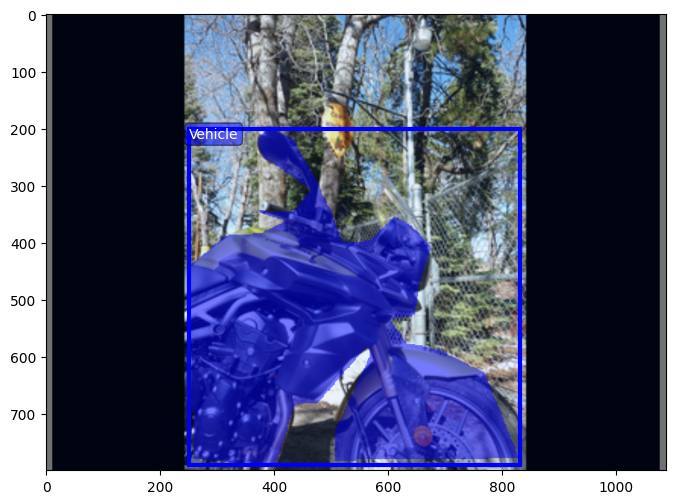

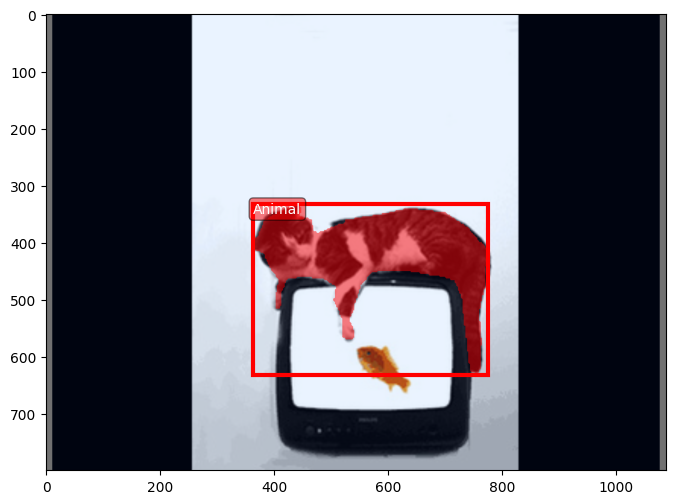

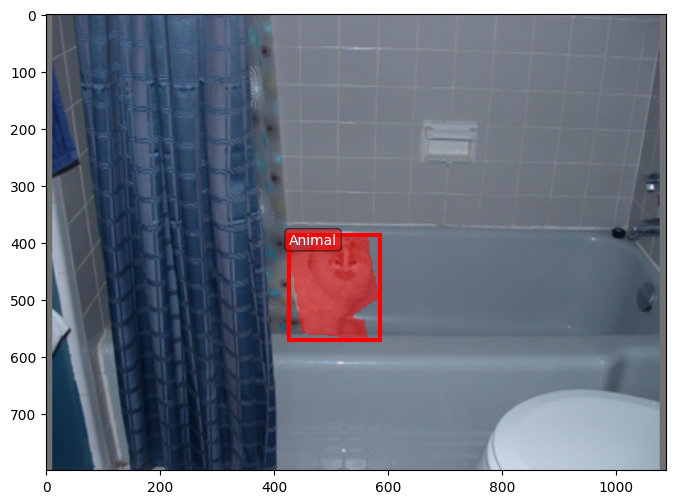

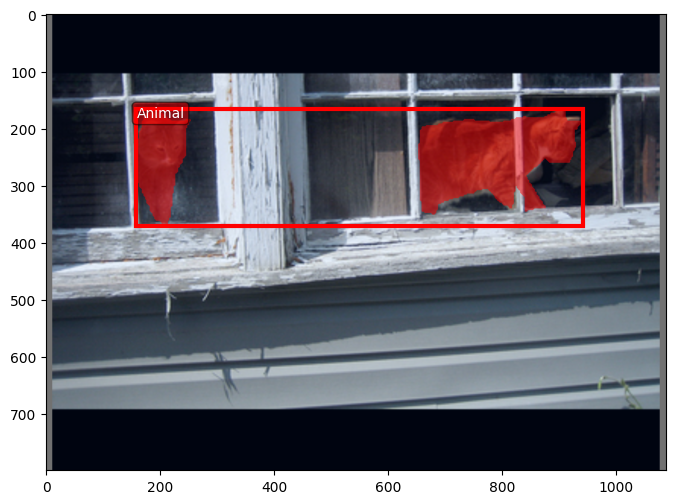

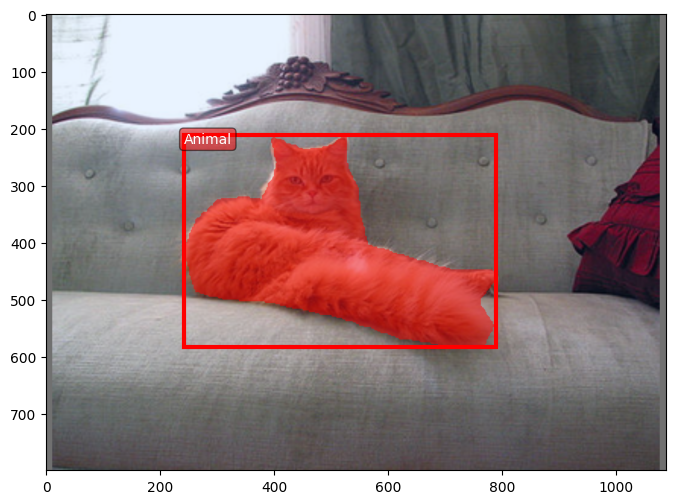

...

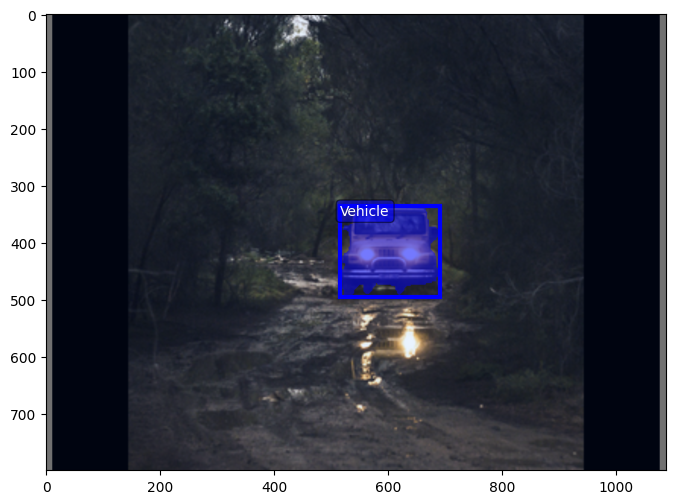

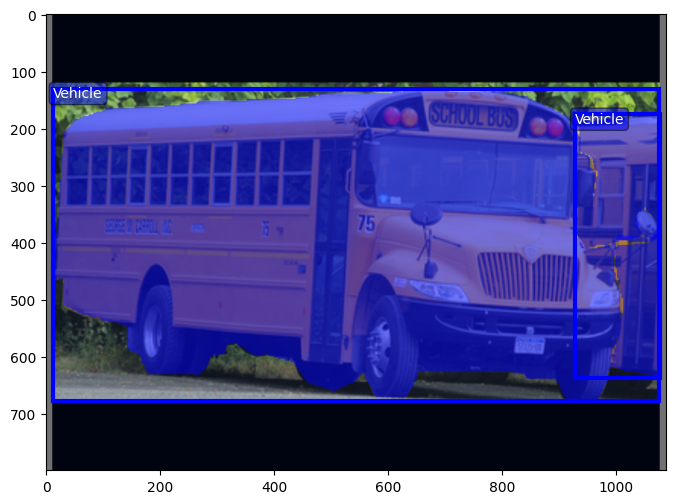

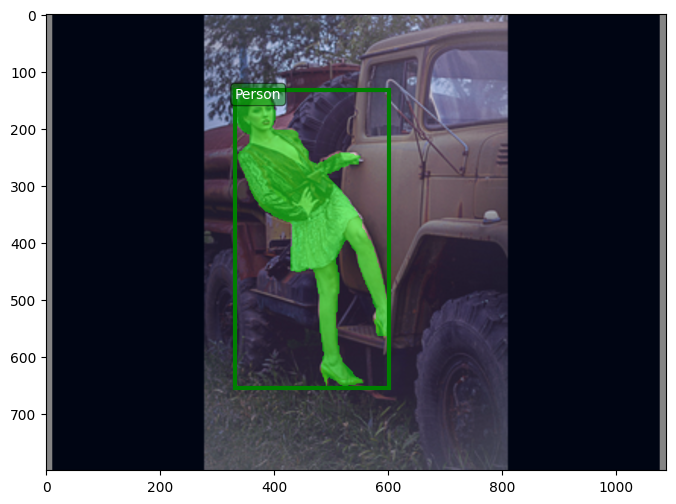

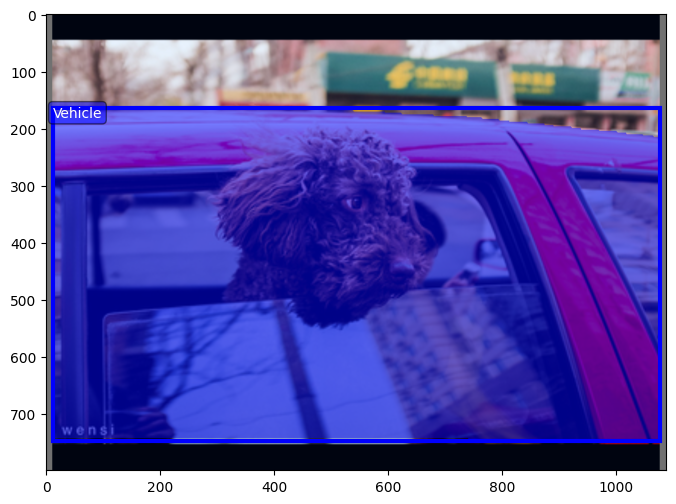

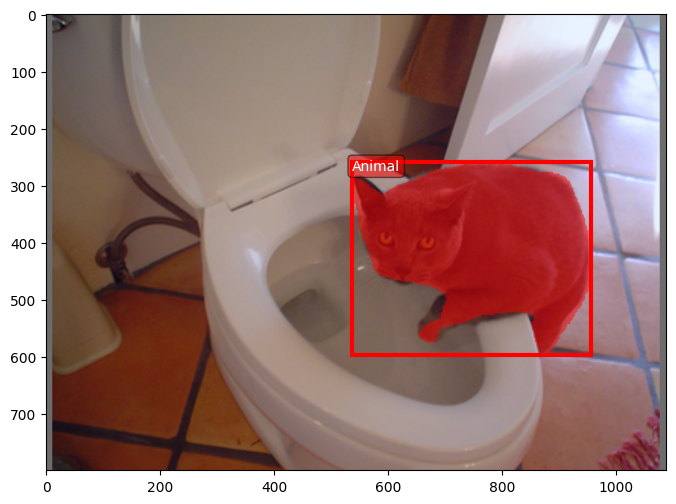

In [6]:
## Visualize debugging
# if __name__ == '__main__':
# file path and make a list
folder_path = '/content/drive/MyDrive/cis6800/solo/'
imgs_path = folder_path+ 'hw3_mycocodata_img_comp_zlib.h5'
masks_path = folder_path+ 'hw3_mycocodata_mask_comp_zlib.h5'
labels_path = folder_path+ 'hw3_mycocodata_labels_comp_zlib.npy'
bboxes_path = folder_path+ 'hw3_mycocodata_bboxes_comp_zlib.npy'
paths = [imgs_path, masks_path, labels_path, bboxes_path]
# load the data into data.Dataset
dataset = BuildDataset(paths)
print("Loaded the data into torch.utils.data.Dataset")

## Visualize debugging
# --------------------------------------------
# build the dataloader
# set 20% of the dataset as the training data
full_size = len(dataset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size
# random split the dataset into training and testset
# set seed
torch.random.manual_seed(1)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
# push the randomized training data into the dataloader

batch_size = 2
train_build_loader = BuildDataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
train_loader = train_build_loader.loader()
test_build_loader = BuildDataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = test_build_loader.loader()

mask_color_list = ["jet", "ocean", "Spectral", "spring", "cool"]
# loop the image
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Device {device}")

# Create the directory if it doesn't exist
output_dir = 'testfig'
os.makedirs(output_dir, exist_ok=True)

for iter, data in enumerate(train_loader, 0):
    img, label, mask, bbox = [data[i] for i in range(len(data))]
    # check flag
    assert img.shape == (batch_size, 3, 800, 1088)
    assert len(mask) == batch_size

    label = [label_img for label_img in label]
    mask = [mask_img for mask_img in mask]
    bbox = [bbox_img for bbox_img in bbox]

    for idx in range(len(img)):
        plot_image = normalize_numpyarray_plot(img[idx].permute((1, 2, 0)).cpu().numpy())
        masked_image = overlay_mask_on_image(plot_image, mask[idx], label[idx], alpha=0.5)
        overlay_boxes_on_image(masked_image, label[idx], bbox[idx], f"{iter}_{idx}")

    if iter == 10:
        break

In [7]:
del plot_image, masked_image

#### Visualization
In order to validate that you are loading the dataset correct, you should plot at least five example images that include the mask, annotations, and bounding boxes. Examples of such images are shown in fig. 5 and 6. Make sure that the color for each class is consistent!

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig5.png" width=500/></div>
<center>Figure 5: Example visualization.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig6.png" width=500/></div>
<center>Figure 6: Example visualization.</center>

### Model
#### Architecture
The model architecture is summarized in fig. 7 and tables 1 and 2.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig7.png" width=500/></div>
<center>Figure 7: SOLO branch structure.</center>
<br>
<center>Table 1: Category branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 3\times3\times(C-1)$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note $C = 4$ here (number of classes + background). |

<br>
<center>Table 2: Mask branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times(256 + 2)$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Two additional input channels represent the $x$ and $y$ positional encoding. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 1\times1\times(\text{num_grid})^2$, stride $= 1$, pad $= 0$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note that $\text{num_grid}$ is different for each layer of the FPN. |

We will be using a pretrained backbone (which includes an FPN), so you will not have to implement those components. A template for the network with along with default parameters is shown below.

#### Feature Pyramid
The feature pyramid extracted below has strides $[4,8,16,32,64]$ over the original image. To match the SOLO paper, this should be interpolated to have strides $[8,8,16,32,32]$.

#### Target Assignment
Some notes about generating the ground truth targets:
* The FPN levels can be though of as different grid sizes cut through the image.
* You assign each target to a certain FPN level if $\sqrt{wh}$ from the bounding box falls within the `scale_range` associated with that level. Note that these overlap, so you may assign the same target to multiple levels.
* A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.
 * The centre region of an object is its bounding box scaled by `epsilon`.
 * Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell.

#### Target Visualization
You should produce visualizations such as fig. 8 and 9 to validate your target assignments.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig8.png" width=500/></div>
<center>Figure 8: Target assignment example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig9.png" width=500/></div>
<center>Figure 9: Target assignment example.</center>

In [6]:
def bbox_fpn_levelwise(sqrt_wh, scale_range):
    min_scale, max_scale = scale_range
    return min_scale <= sqrt_wh <= max_scale

def calculate_scaled_dimensions(bbox_obj, grid_count, img_w, img_h):
    scale_factors = [grid_count / img_w, grid_count / img_h]
    bbox_obj[0::2] *= scale_factors[0]
    bbox_obj[1::2] *= scale_factors[1]
    return bbox_obj

def apply_epsilon_to_bbox(bbox_obj, epsilon):
    offset = ((1 - epsilon) * 0.5) * (bbox_obj[2:4] - bbox_obj[0:2])
    bbox_obj[0:2] += offset
    bbox_obj[2:4] -= offset
    return bbox_obj

def finalize_and_clip_bbox(bbox_obj, grid_count):
    # reference:
    # 1. https://numpy.org/doc/stable/reference/generated/numpy.clip.html
    # 2. GPT
    bbox_obj = np.clip(bbox_obj, 0, grid_count - 1)
    lower_part = np.floor(bbox_obj[:2])
    upper_part = np.ceil(bbox_obj[2:4])
    return np.concatenate((lower_part, upper_part)).astype(np.int8)

def scaledbbox_center(bbox_obj, num_grids, epsilon, image_width=1088, image_height=800):
    bbox_obj = calculate_scaled_dimensions(bbox_obj.copy().astype(float), num_grids, image_width, image_height)
    bbox_obj = apply_epsilon_to_bbox(bbox_obj, epsilon)
    return finalize_and_clip_bbox(bbox_obj, num_grids)

def generate_channel_indices(lower_bound_x, lower_bound_y, upper_bound_x, upper_bound_y, grid_dimension):
    indices = []
    for x in range(lower_bound_x, upper_bound_x):
        for y in range(lower_bound_y, upper_bound_y):
            index = y * grid_dimension + x
            indices.append(index)
    return indices

def extract_coordinates(scaled_bbox):
    lower_x = scaled_bbox[0]
    lower_y = scaled_bbox[1]
    upper_x = scaled_bbox[2]
    upper_y = scaled_bbox[3]
    return lower_x, lower_y, upper_x, upper_y

def channels_bbox_center(scaled_bbox_center, grid_size):
    coordinates = extract_coordinates(scaled_bbox_center)
    channel_indices = generate_channel_indices(*coordinates, grid_size)
    return channel_indices

def compute_dimensions(stride, height=800, width=1088):
    def calculate_dimension(dim, stride):
        return int(dim / stride)

    feature_height = calculate_dimension(height, stride)
    feature_width = calculate_dimension(width, stride)

    return feature_height, feature_width

def feature_h_w(stride, image_height=800, image_width=1088):
    return compute_dimensions(stride, image_height, image_width)

In [7]:
from functools import partial
class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'categ_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(categ_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5),
        'image_height': 800,
        'image_width': 1088
    }

    def __init__(self, **kwargs):
        super().__init__()
        for k, v in {**self._default_cfg, **kwargs}.items():
            setattr(self, k, v)

        # params changed to avoid deprecation warning
        pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights=False, weights_backbone=True)
        self.backbone = pretrained_model.backbone

        # References:
        # 1. https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html
        # 2. https://machinelearningknowledge.ai/pytorch-conv2d-explained-with-examples/
        self.conv1_category= nn.Sequential(
            nn.Conv2d(self.in_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv2_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv3_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv4_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv5_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv6_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv7_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv_out_category = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_classes-1, kernel_size=3, stride = 1, padding = 1, bias = True),
            nn.Sigmoid())

        self.category_branch = nn.Sequential(self.conv1_category,self.conv2_category,self.conv3_category,self.conv4_category,self.conv5_category,self.conv6_category,self.conv7_category,self.conv_out_category)

        self.conv1_mask = nn.Sequential(
            # Two additional input channels represent the x and y positional encoding.
            nn.Conv2d(self.in_channels+2, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU())
        self.conv2_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )
        self.conv3_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )
        self.conv4_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )
        self.conv5_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )
        self.conv6_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )
        self.conv7_mask = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.seg_feat_channels, kernel_size=3, stride = 1, padding = 1, bias = False),
            nn.GroupNorm(32,256),
            nn.ReLU()
        )

        self.maskbranch = nn.Sequential(self.conv1_mask,self.conv2_mask,self.conv3_mask,self.conv4_mask,self.conv5_mask,self.conv6_mask,self.conv7_mask)

        self.convout_mask0 = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_grids[0]**2, kernel_size=1, stride = 1, padding = 0, bias = True),
            nn.Sigmoid()
        )
        self.convout_mask1 = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_grids[1]**2, kernel_size=1, stride = 1, padding = 0, bias = True),
            nn.Sigmoid()
        )
        self.convout_mask2 = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_grids[2]**2, kernel_size=1, stride = 1, padding = 0, bias = True),
            nn.Sigmoid()
        )
        self.convout_mask3 = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_grids[3]**2, kernel_size=1, stride = 1, padding = 0, bias = True),
            nn.Sigmoid()
        )
        self.convout_mask4 = nn.Sequential(
            nn.Conv2d(self.seg_feat_channels, self.num_grids[4]**2, kernel_size=1, stride = 1, padding = 0, bias = True),
            nn.Sigmoid()
        )

        self.finalmasklayer = {0:self.convout_mask0, 1:self.convout_mask1, 2:self.convout_mask2, 3:self.convout_mask3, 4:self.convout_mask4}

    def forward(self, inputs, eval=False):
        fpn_feat_list = list(self.backbone(inputs).values())
        new_fpn_list = self.NewFPN(fpn_feat_list)
        cat_results, mask_results = [], []

        for idx, feature in enumerate(new_fpn_list):
            cat_pred, ins_pred = self.forward_single_level(feature, idx, eval)
            cat_results.append(cat_pred)
            mask_results.append(ins_pred)

        return cat_results, mask_results

    def NewFPN(self, fpn_feat_list):
        fpn = []
        for idx, value in enumerate(fpn_feat_list):
            height = int(self.image_height / self.strides[idx])
            width = int(self.image_width / self.strides[idx])
            scaled_feature = F.interpolate(value.detach(), (height, width), mode='bilinear', align_corners=False)
            fpn.append(scaled_feature)
        return fpn

    def forward_single_level(self, fpn_feat, idx, eval=False):
        cat_fpn = F.interpolate(fpn_feat, (self.num_grids[idx], self.num_grids[idx]), mode='bilinear', align_corners=False)
        cat_pred = self.category_branch(cat_fpn)

        mask_fpn = self.augment_features(fpn_feat)
        mask = self.finalmasklayer[idx](self.maskbranch(mask_fpn))

        # References:
        # 1) https://pytorch.org/docs/stable/generated/torch.nn.functional.interpolate.html
        # 2) GPT

        if not eval:
            ins_pred = F.interpolate(mask, (mask.shape[-2] * 2, mask.shape[-1] * 2), mode='bilinear', align_corners=False)
        else:
            cat_pred = cat_pred.permute(0, 2, 3, 1)
            ins_pred = F.interpolate(mask, (int(self.image_height / 4), int(self.image_width / 4)), mode='bilinear', align_corners=False)

        return cat_pred, ins_pred

    def augment_features(self, feature):
        y = torch.linspace(-1, 1, feature.shape[-2], device=self.device)
        x = torch.linspace(-1, 1, feature.shape[-1], device=self.device)
        y_grid, x_grid = torch.meshgrid(y, x)
        coord_features = torch.stack((y_grid, x_grid)).unsqueeze(0).repeat(feature.shape[0], 1, 1, 1)
        return torch.cat((feature, coord_features), 1)

    def generate_targets(self, bounding_boxes, labels, masks):
        accumulated_categories, accumulated_mask_activations, accumulated_masks = [], [], []

        bbox_enum = enumerate(bounding_boxes)
        for img_index, each_bbox_set in bbox_enum:
            cat_targets, mask_acts, masks_set = [], [], []

            for level_index, each_grid in enumerate(self.num_grids):
                feature_h, feature_w = feature_h_w(
                    self.strides[level_index], 800, 1088)

                category_map = torch.zeros(
                    (each_grid, each_grid), dtype=torch.long, device=self.device)
                mask_map = torch.zeros(each_grid * each_grid, 2 *
                                      feature_h, 2 * feature_w, dtype=torch.float32, device=self.device)
                activation_map = torch.zeros(
                    each_grid * each_grid, dtype=torch.float32, device=self.device)

                cat_targets.append(category_map)
                masks_set.append(mask_map)
                mask_acts.append(activation_map)

            bbox_set_enum = enumerate(each_bbox_set)
            for object_index, each_bbox in bbox_set_enum:
                bbox_w = each_bbox[2] - each_bbox[0]
                bbox_h = each_bbox[3] - each_bbox[1]
                sqrt_size = pow(bbox_w * bbox_h, 0.5)
                label = labels[img_index][object_index]
                mask = masks[img_index][object_index].unsqueeze(
                    0).unsqueeze(0).float()

                scale_enum = enumerate(self.scale_ranges)
                for idx, scale in scale_enum:
                    if scale[0] <= sqrt_size <= scale[1]:
                        scaled_bbox = scaledbbox_center(
                            each_bbox, self.num_grids[idx], self.epsilon)

                        cat_targets[idx][scaled_bbox[1]:scaled_bbox[3], scaled_bbox[0]:scaled_bbox[2]] = label

                        resized_h, resized_w = feature_h_w(
                            self.strides[idx])

                        # References:
                        # 1. https://pytorch.org/docs/stable/generated/torch.nn.functional.interpolate.html
                        # 2. GPT
                        resized_mask = F.interpolate(
                            mask, (2 * resized_h, 2 * resized_w)).squeeze()
                        ch_indices = channels_bbox_center(
                            scaled_bbox, self.num_grids[idx])

                        masks_set[idx][ch_indices] = resized_mask
                        mask_acts[idx][ch_indices] = 1.0

            accumulated_categories.append(cat_targets)
            accumulated_masks.append(masks_set)
            accumulated_mask_activations.append(mask_acts)

        return accumulated_categories, accumulated_masks, accumulated_mask_activations

In [10]:
batch_size = 10
train_build_loader = BuildDataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
train_loader = train_build_loader.loader()
test_build_loader = BuildDataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = test_build_loader.loader()

In [11]:
for iter, data in enumerate(train_loader, 0):
    img, label, mask, bbox = [data[i] for i in range(len(data))]
    if iter == 1:
        break

In [12]:
SOLO_model = SOLO()
target_categ, target_mask,target_activation = SOLO_model.generate_targets(bounding_boxes = bbox, labels=label, masks=mask)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 264MB/s]


In [8]:
def collect_target_masks_and_labels(target_categ_image, target_mask_image, target_activation_image, image_height=800, image_width=1088):
    active_elements = torch.nonzero(target_activation_image, as_tuple=True)
    encountered_masks = set()

    selected_masks, associated_labels = [], []
    flat_categ_image = target_categ_image.view(-1)

    masks = target_mask_image[active_elements]
    labels = flat_categ_image[active_elements]


    for i in range(masks.size(0)):
        mask_signature = (torch.sum(masks[i]).item(), labels[i].item())

        if mask_signature not in encountered_masks:
            encountered_masks.add(mask_signature)

            # References:
            # 1. https://pytorch.org/docs/stable/generated/torch.nn.functional.interpolate.html
            # 2. https://github.com/pytorch/pytorch/issues/34808
            # 3. GPT
            mask_resized = F.interpolate(masks[i][None, None, ...], (image_height, image_width), mode='bilinear', align_corners=False).squeeze()
            selected_masks.append(mask_resized)
            associated_labels.append(labels[i].item())

    return selected_masks, associated_labels


def display_fpn_masks(image, image_idx, target_categ_fpn, target_mask_fpn, target_activation_fpn):
    # Reference:
    # 1. https://www.geeksforgeeks.org/matplotlib-figure-figure-delaxes-in-python/
    # 2. GPT
    def get_mask_and_labels(fpn_level):
        return collect_target_masks_and_labels(
            target_categ_fpn[fpn_level],
            target_mask_fpn[fpn_level],
            target_activation_fpn[fpn_level]
        )

    def plot_fpn_level(ax, image_to_plot, masks, labels, level):
        img_with_masks = overlay_mask_on_image(image_to_plot, masks, labels, 0.5).astype(float)
        ax.imshow(img_with_masks)
        ax.set_title(f"FPN Level {level}", fontsize=10)

    fpn_levels = range(len(target_categ_fpn))
    fpn_masks_and_labels = [get_mask_and_labels(i) for i in fpn_levels]

    norm_image = normalize_numpyarray_plot(image[image_idx].permute(1,2,0).numpy())

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.flatten()  # Flattening to make indexing easier

    for i, (masks, labels) in enumerate(fpn_masks_and_labels):
        plot_fpn_level(axes[i], norm_image, masks, labels, i)

    fig.delaxes(axes[5])

    plt.tight_layout()
    plt.show()

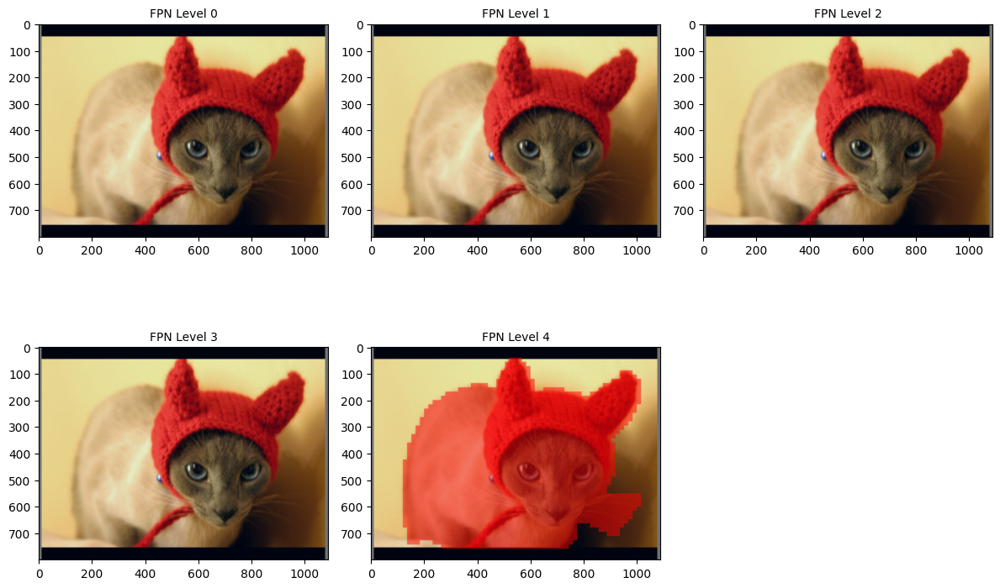

----------------------------------------------------------------------------------------------------


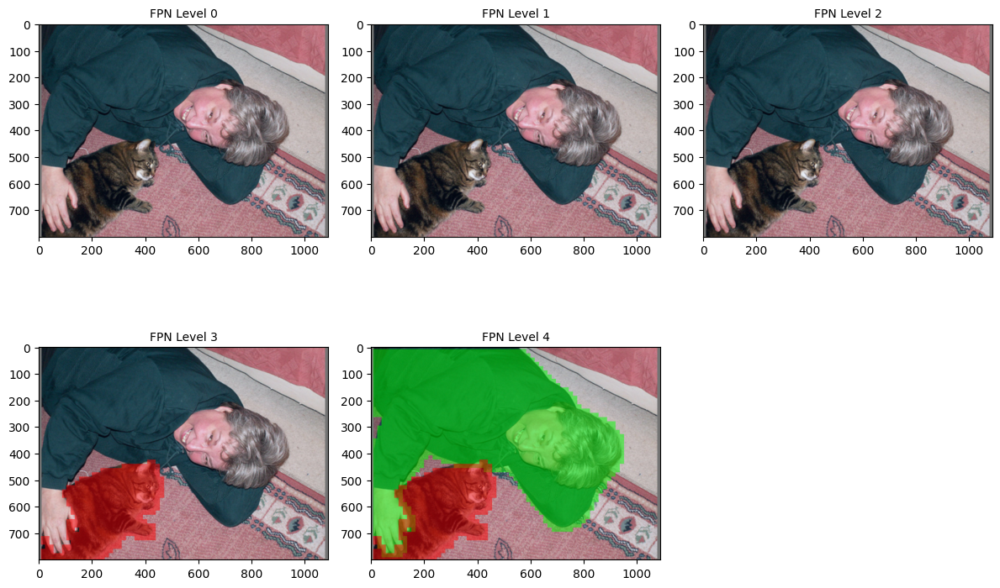

----------------------------------------------------------------------------------------------------


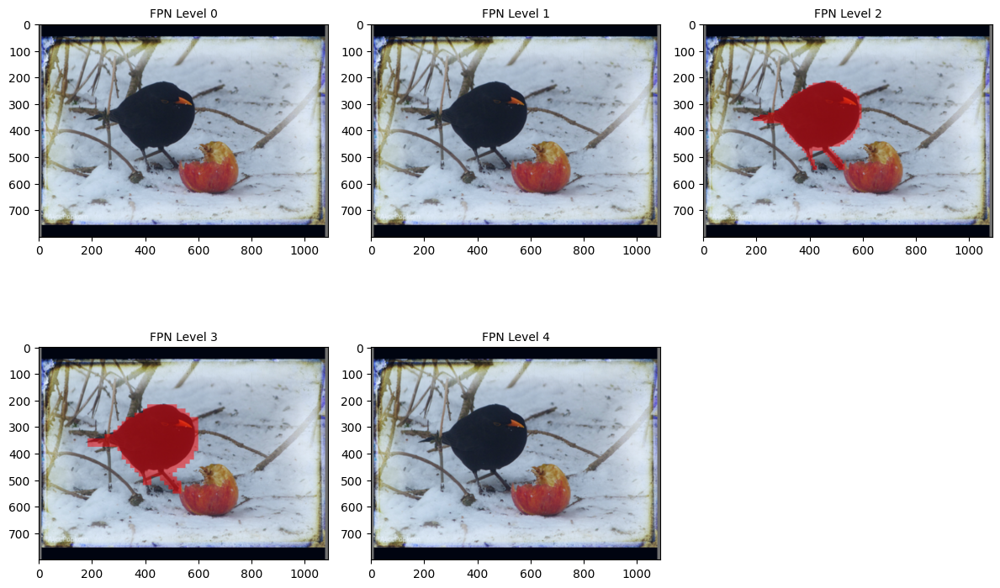

----------------------------------------------------------------------------------------------------


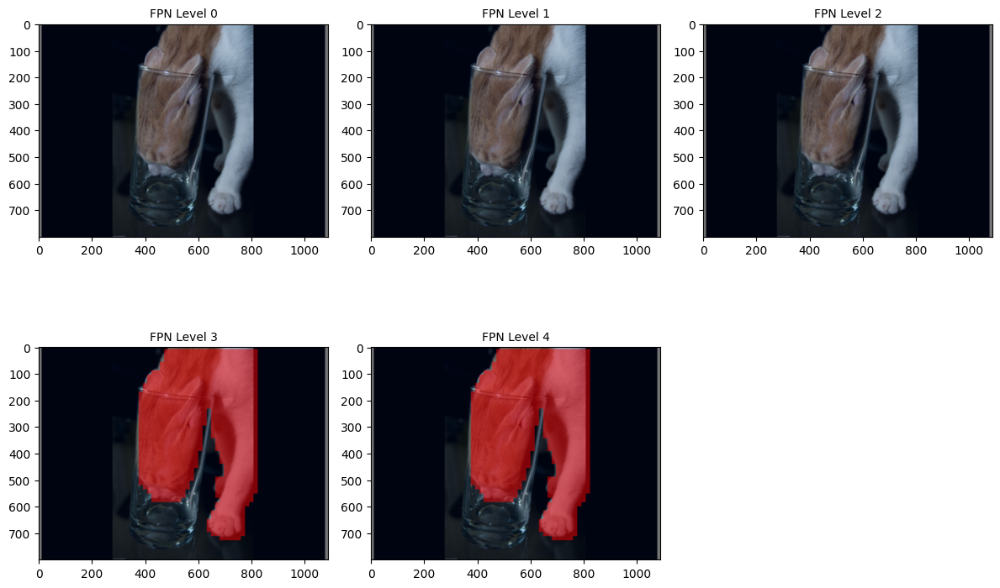

----------------------------------------------------------------------------------------------------


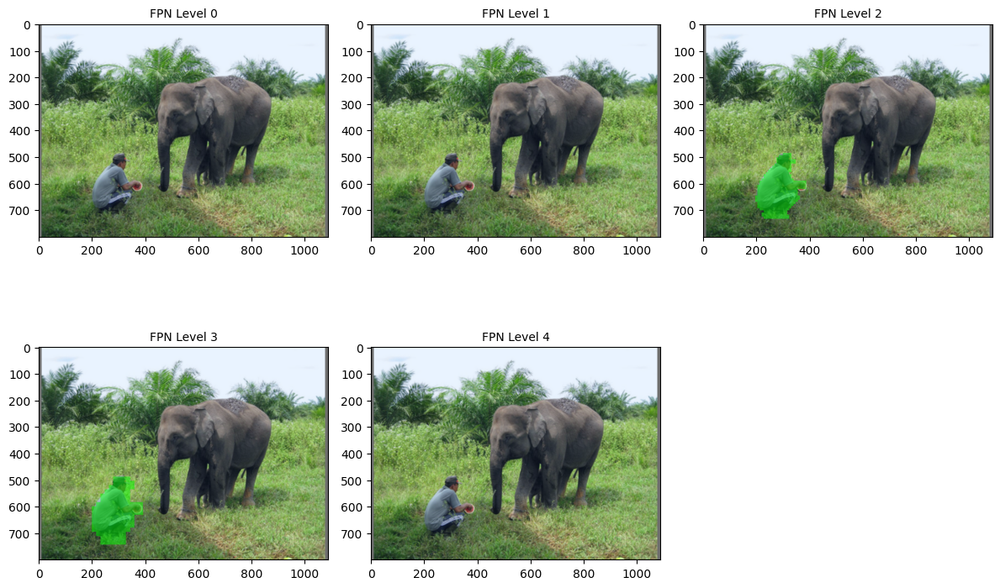

----------------------------------------------------------------------------------------------------


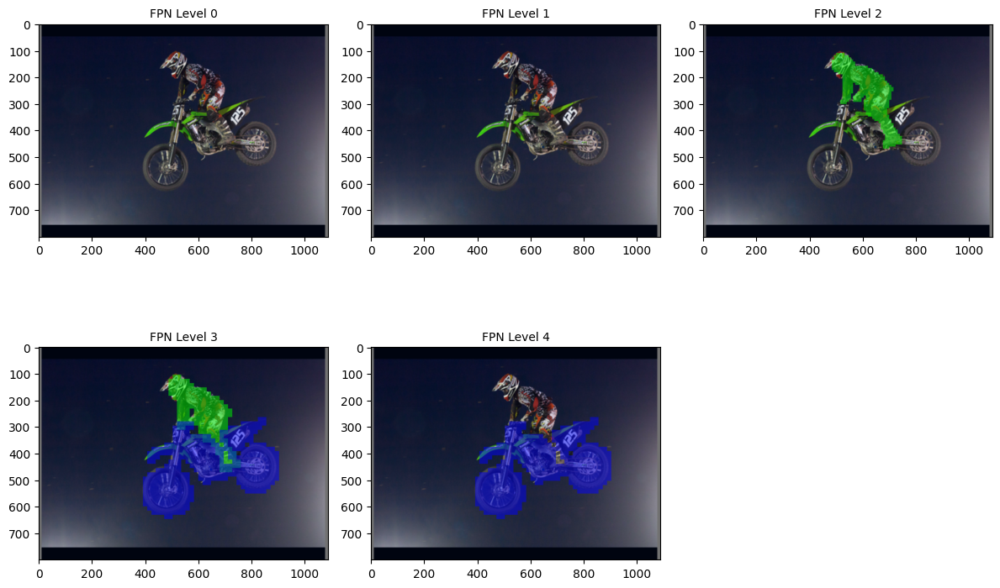

----------------------------------------------------------------------------------------------------


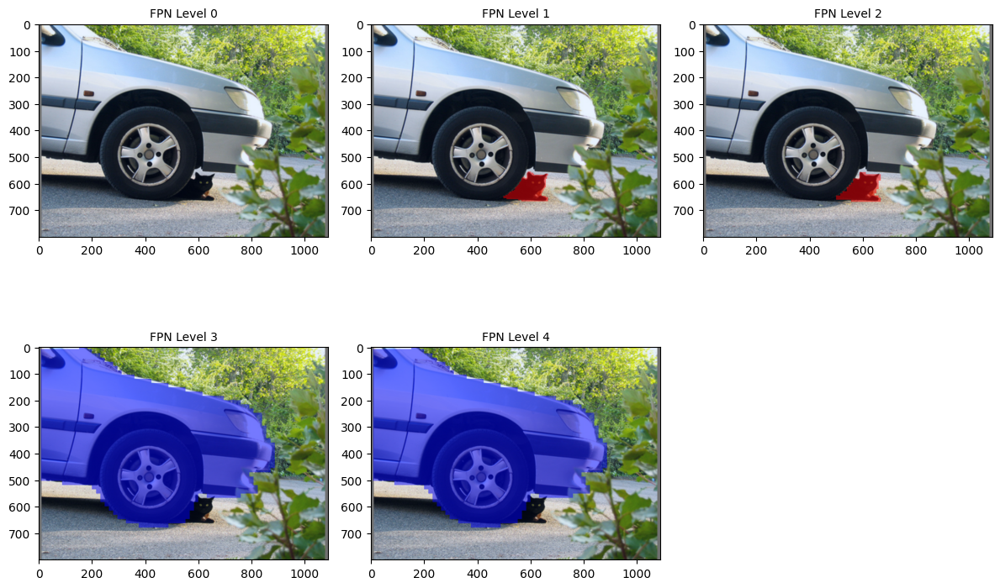

----------------------------------------------------------------------------------------------------


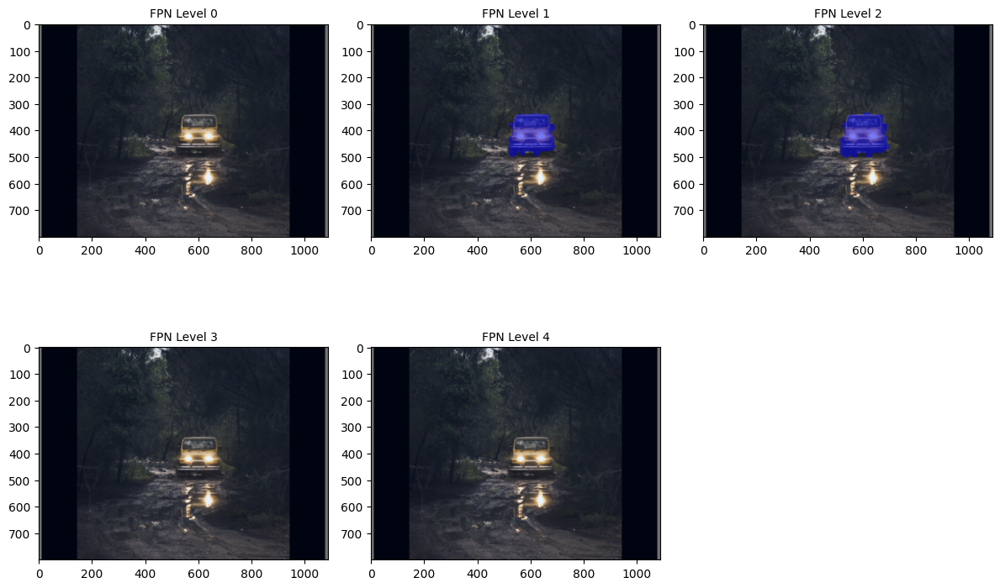

----------------------------------------------------------------------------------------------------


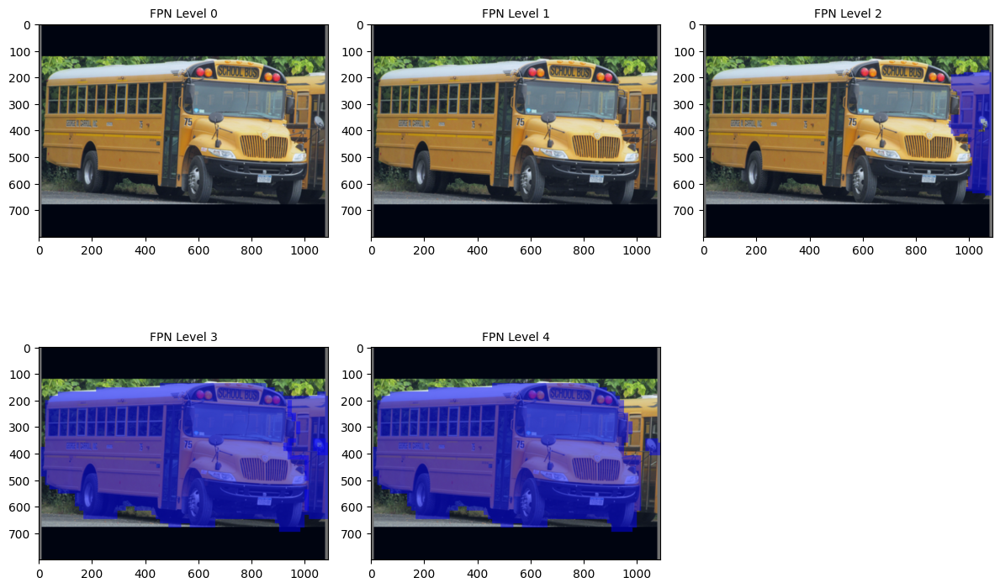

----------------------------------------------------------------------------------------------------


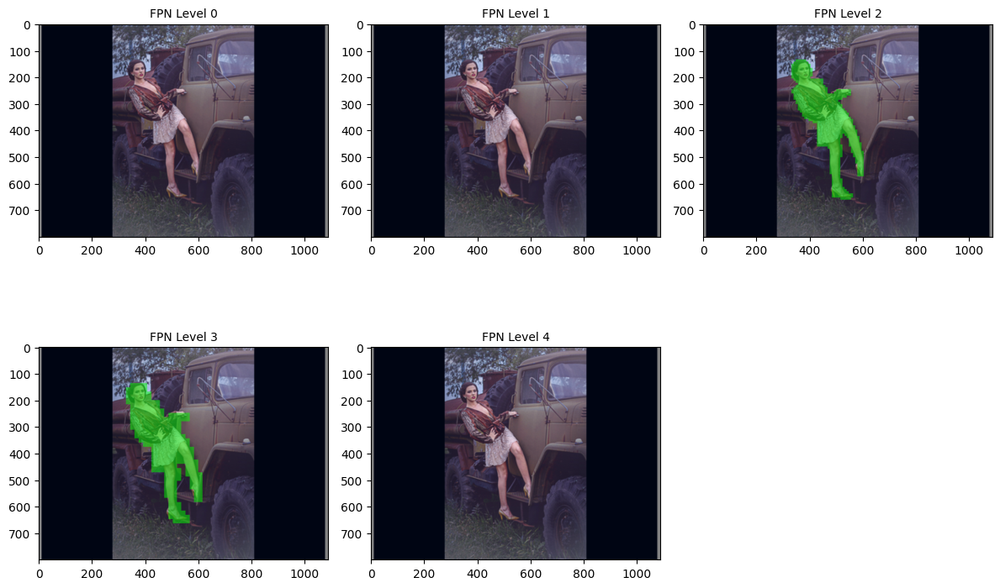

----------------------------------------------------------------------------------------------------


In [14]:
def process_image_index(idx, categ, mask, activation, image):
    categ_fpn = categ[idx]
    mask_fpn = mask[idx]
    activation_fpn = activation[idx]
    display_fpn_masks(image, idx, categ_fpn, mask_fpn, activation_fpn)
    print('-' * 100)

# Iterating through each image index
for idx in range(len(target_categ)):
    process_image_index(idx, target_categ, target_mask, target_activation, img)

### Part A Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. Should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so.

## Part B
### Loss
The loss function consists of two parts: category loss and mask loss:
$$L = \lambda_\text{cate} L_\text{cate} + \lambda_\text{mask} L_\text{mask} $$

The category loss is defined as (where $\text{FL}$ is the focal loss)

$$L_\text{cate} = \frac{1}{S^2 C} \sum_{S,S,C} \text{FL}(p_t)$$

$$\text{FL}(p_t) = -\alpha_t (1 - p_t)^\gamma \log{(p_t)}$$

$$(\alpha_t, p_t) = \left\{\begin{array}{lr} (\alpha, \hat{p}) & \text{if }y=1 \\ (1 - \alpha, 1 - \hat{p}) & \text{otherwise}\end{array}\right.$$

while the mask loss is defined as (where $d_\text{mask}$ is the dice loss)

$$L_\text{mask} = \frac{1}{N_\text{positive}} \sum_k \mathbb{1}_{\{p_{i, j} > 0\}} d_\text{mask}(m_k, \hat{m}_k)$$

$$d_\text{mask}(p, q) = 1 - D(p, q)$$

$$D(p, q) = \frac{2 \sum_{x,y}(p_{x,y} \cdot q_{x,y})}{\sum_{x,y}p_{x,y}^2 + \sum_{x,y}q_{x,y}^2}$$

### Post Processing
Post processing consists of three steps: points NMS, concatenation and sorting, and matrix NMS. A summary of each of these steps is provided below. In addition, your final mask prediction should be a binary mask based on the mask thresholding parameter. Some examples of results post-inference are shown in figs. 11-14.


<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig11.png" width=300/></div>
<center>Figure 11: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig12.png" width=300/></div>
<center>Figure 12: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig13.png" width=300/></div>
<center>Figure 13: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig14.png" width=300/></div>
<center>Figure 14: SOLO instance segmentation example.</center>

### Training
#### Optimizer
The SGD optimizer with a weight decay of 1e-4 and a momentum of 0.9 is used. For a batch size of 16, an initial learning rate of 16 is used (this should be scaled appropriately for different batch sizes). You should train for 36 epochs, reducing the learning rate by a factor of 10 at epochs 27 and 33.

#### Data Augemnetation
To achieve better performance, you may wish to explore some data augmentation techniques. You should be able to achieve the necessary performance without any augmentation, however.

#### Checkpointing
Due to the long training time, we highly recommend that you set up regular checkpointing during your training in case your training gets interrupted (e.g. your colab session ending).

In [ ]:
# file path and make a list
folder_path = '/content/drive/MyDrive/cis6800/solo/'
imgs_path = folder_path+ 'hw3_mycocodata_img_comp_zlib.h5'
masks_path = folder_path+ 'hw3_mycocodata_mask_comp_zlib.h5'
labels_path = folder_path+ 'hw3_mycocodata_labels_comp_zlib.npy'
bboxes_path = folder_path+ 'hw3_mycocodata_bboxes_comp_zlib.npy'
paths = [imgs_path, masks_path, labels_path, bboxes_path]
# load the data into data.Dataset
dataset = BuildDataset(paths)
print("Loaded the data into torch.utils.data.Dataset")

# set 20% of the dataset as the training data
full_size = len(dataset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size
# random split the dataset into training and testset
# set seed
torch.random.manual_seed(1)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
# push the randomized training data into the dataloader

batch_size = 2
train_build_loader = BuildDataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
train_loader = train_build_loader.loader()
test_build_loader = BuildDataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = test_build_loader.loader()

Loaded the data into torch.utils.data.Dataset


In [9]:
# SOLOTrainer inherits the SOLO class defined above


class SOLOTrainer(SOLO):
    def __init__(self, batch_size=8):
        super().__init__()

        self.focal_loss_ = []
        self.focal_loss_validation = []
        self.focal_loss_epochwise = []
        self.focal_loss_epochwise_val = []

        self.batch_size = batch_size

        self.dice_loss_ = []
        self.dice_loss_validation = []
        self.dice_loss_epochwise = []
        self.dice_loss_epochwise_val = []

        self.train_loss_epochwise = []
        self.train_losses = []

        self.val_losses = []
        self.val_loss_epochwise = []

    def focal_loss(self, predicted_categories, target_categories):
        alpha = self.categ_loss_cfg['alpha']
        gamma = self.categ_loss_cfg['gamma']
        epsilon = 1e-6  # To prevent division by zero and log(0)
        focal_loss_value = sum(
            -torch.mean(
                alpha * (1 - prediction) ** gamma * target_one_hot * torch.log(prediction + epsilon)
                + (1 - alpha) * prediction ** gamma * (1 - target_one_hot) * torch.log(1 - prediction + epsilon)
            )
            for idx, prediction in enumerate(predicted_categories)
            for target_category_level in [torch.stack([category[idx] for category in target_categories])]
            for target_one_hot in [F.one_hot(target_category_level, num_classes=4)[:, :, :, 1:].permute(0, 3, 1, 2)]
        )

        return focal_loss_value

# References:
# 1. # https://pytorch.org/docs/stable/nn.html
# 2. GPT

    def dice_loss(self, predictions, target_masks, mask_activations):
        total_dice_loss = 0

        for idx in range(5):
            target_masks_level = torch.stack([mask[idx] for mask in target_masks])
            activations_level = torch.stack([activation[idx] for activation in mask_activations])

            overlap = torch.sum(predictions[idx] * target_masks_level, dim=(-1, -2))
            area = torch.sum(torch.square(predictions[idx]), dim=(-1, -2)) + torch.sum(torch.square(target_masks_level), dim=(-1, -2))

            dice_coefficient = 1 - (2 * overlap / area)
            weighted_dice = activations_level * dice_coefficient
            normalized_dice = torch.sum(weighted_dice) / torch.clamp(torch.sum(activations_level), min=1e-6)

            total_dice_loss += normalized_dice

        return total_dice_loss

    def solo_loss(self, pred_categ_batch, pred_mask_batch, trg_categ, trg_mask, trg_mask_act):
        focal_loss_value = self.focal_loss(pred_categ_batch, trg_categ)
        dice_loss_value = self.dice_loss(pred_mask_batch, trg_mask, trg_mask_act)
        total_loss = sum(val * cfg['weight'] for val, cfg in zip((focal_loss_value, dice_loss_value),
                                                                  (self.categ_loss_cfg, self.mask_loss_cfg)))
        return focal_loss_value, dice_loss_value, total_loss

    def training_step(self, batch, batch_idx):
        image, label, mask, bbox = batch
        pred_categ_batch, pred_mask_batch = self(image)
        trg_categ, trg_mask, trg_mask_act = self.generate_targets(bbox, label, mask)
        focal_loss_, dice_loss_, train_loss = self.solo_loss(
            pred_categ_batch, pred_mask_batch, trg_categ, trg_mask, trg_mask_act
        )
        logs = {
            "train_loss": train_loss,
            "focal_loss": focal_loss_,
            "dice_loss": dice_loss_
        }
        self.log_dict(logs, prog_bar=True, on_step=True, on_epoch=True, logger=True)
        self.train_losses.append(train_loss.item())
        self.focal_loss_.append(focal_loss_.item())
        self.dice_loss_.append(dice_loss_.item())

        return train_loss

    def validation_step(self, batch, batch_idx):
        image, label, mask, bbox = batch
        pred_categ_batch, pred_mask_batch = self(image)
        trg_categ, trg_mask, trg_mask_act = self.generate_targets(bbox, label, mask)
        focal_loss_, dice_loss_, val_loss = self.solo_loss(
            pred_categ_batch, pred_mask_batch, trg_categ, trg_mask, trg_mask_act
        )
        logs = {
            "val_loss": val_loss,
            "val_focal_loss": focal_loss_,
            "val_dice_loss": dice_loss_
        }
        self.log_dict(logs, prog_bar=True, on_step=True, on_epoch=True, logger=True)
        self.val_losses.append(val_loss.item())
        self.focal_loss_validation.append(focal_loss_.item())
        self.dice_loss_validation.append(dice_loss_.item())

        return val_loss

    def on_train_epoch_end(self):
        print("Train epoch :", len(self.train_loss_epochwise))

        self.train_loss_epochwise.append(torch.tensor(self.train_losses).mean().item())
        self.focal_loss_epochwise.append(torch.tensor(self.focal_loss_).mean().item())
        self.dice_loss_epochwise.append(torch.tensor(self.dice_loss_).mean().item())

        print(f"train_loss_epochwise: {torch.tensor(self.train_losses).mean().item()}")
        print(f"focal_loss_epochwise: {torch.tensor(self.focal_loss_).mean().item()}")
        print(f"dice_loss_epochwise: {torch.tensor(self.dice_loss_).mean().item()}")

        self.log("train_loss_epochwise", torch.tensor(self.train_losses).mean().item(), prog_bar = True, logger=True, on_epoch=True)
        self.log("focal_loss_epochwise", torch.tensor(self.focal_loss_).mean().item(), prog_bar = True, logger=True, on_epoch=True)
        self.log("dice_loss_epochwise", torch.tensor(self.dice_loss_).mean().item(), prog_bar = True, logger=True, on_epoch=True)

        self.train_losses.clear()
        self.focal_loss_.clear()
        self.dice_loss_.clear()

    def on_validation_epoch_end(self):
        print("Val epoch :", len(self.val_loss_epochwise))

        self.val_loss_epochwise.append(torch.tensor(self.val_losses).mean().item())
        self.focal_loss_epochwise_val.append(torch.tensor(self.focal_loss_validation).mean().item())
        self.dice_loss_epochwise_val.append(torch.tensor(self.dice_loss_validation).mean().item())

        print(f"val_loss_epochwise: {torch.tensor(self.val_losses).mean().item()}")
        print(f"focal_loss_epochwise_val: {torch.tensor(self.focal_loss_validation).mean().item()}")
        print(f"dice_loss_epochwise_val: {torch.tensor(self.dice_loss_validation).mean().item()}")

        self.log("val_loss_epochwise", torch.tensor(self.val_losses).mean().item(), prog_bar = True, logger=True, on_epoch=True)
        self.log("focal_loss_epochwise_val", torch.tensor(self.focal_loss_validation).mean().item(), prog_bar = True, logger=True, on_epoch=True)
        self.log("dice_loss_epochwise_val", torch.tensor(self.dice_loss_validation).mean().item(), prog_bar = True, logger=True, on_epoch=True)

        self.val_losses.clear()
        self.focal_loss_validation.clear()
        self.dice_loss_validation.clear()

    def configure_optimizers(self):
        lr_multiplier = self.batch_size / 16
        optimizer = torch.optim.SGD(self.parameters(), weight_decay=1e-4, momentum=0.9, lr=1e-2 * lr_multiplier)
        lr_scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[27, 33], gamma=0.1)

        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                'scheduler': lr_scheduler,
                'interval': 'epoch',
            }
        }

In [10]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Device {device}")

Device cuda:0


In [11]:
with torch.no_grad():
    torch.cuda.empty_cache()

In [ ]:
from pytorch_lightning.callbacks import LearningRateMonitor
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks

SOLOtrainer = SOLOTrainer(batch_size=batch_size).to(device)

save_directory = "/content/drive/MyDrive/cis6800/solo/logs2"
tensorboard_logger = pl_loggers.TensorBoardLogger(save_dir = save_directory)
learning_rate_monitor = LearningRateMonitor(logging_interval='epoch')
chkpt_callback = pl_callbacks.ModelCheckpoint()

trainer = pl.Trainer(accelerator="gpu",
                     logger=tensorboard_logger,
                     max_epochs=36,
                     callbacks=[chkpt_callback, learning_rate_monitor]
                     )
trainer.fit(SOLOtrainer, train_loader, test_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.ran

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Val epoch : 0
val_loss_epochwise: 10.770164489746094
focal_loss_epochwise_val: 0.620375394821167
dice_loss_epochwise_val: 3.383263111114502


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:76: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Val epoch : 1
val_loss_epochwise: 3.362009286880493
focal_loss_epochwise_val: 0.0067597865127027035
dice_loss_epochwise_val: 1.1184165477752686
Train epoch : 0
train_loss_epochwise: 3.733353614807129
focal_loss_epochwise: 0.009763406589627266
dice_loss_epochwise: 1.241196632385254


Validation: 0it [00:00, ?it/s]

Val epoch : 2
val_loss_epochwise: 3.0444564819335938
focal_loss_epochwise_val: 0.005985629744827747
dice_loss_epochwise_val: 1.0128235816955566
Train epoch : 1
train_loss_epochwise: 2.814164876937866
focal_loss_epochwise: 0.006383434869349003
dice_loss_epochwise: 0.9359272122383118


Validation: 0it [00:00, ?it/s]

Val epoch : 3
val_loss_epochwise: 2.8392012119293213
focal_loss_epochwise_val: 0.005713973194360733
dice_loss_epochwise_val: 0.9444957375526428
Train epoch : 2
train_loss_epochwise: 2.462756395339966
focal_loss_epochwise: 0.005753051023930311
dice_loss_epochwise: 0.8190011382102966


Validation: 0it [00:00, ?it/s]

Val epoch : 4
val_loss_epochwise: 2.687329053878784
focal_loss_epochwise_val: 0.0055759744718670845
dice_loss_epochwise_val: 0.8939177393913269
Train epoch : 3
train_loss_epochwise: 2.218256950378418
focal_loss_epochwise: 0.005434093531221151
dice_loss_epochwise: 0.7376075983047485


Validation: 0it [00:00, ?it/s]

Val epoch : 5
val_loss_epochwise: 2.601346254348755
focal_loss_epochwise_val: 0.005487377755343914
dice_loss_epochwise_val: 0.8652863502502441
Train epoch : 4
train_loss_epochwise: 2.027632474899292
focal_loss_epochwise: 0.005210825242102146
dice_loss_epochwise: 0.674140453338623


Validation: 0it [00:00, ?it/s]

Val epoch : 6
val_loss_epochwise: 2.538422107696533
focal_loss_epochwise_val: 0.005435481201857328
dice_loss_epochwise_val: 0.8443288207054138
Train epoch : 5
train_loss_epochwise: 1.8572922945022583
focal_loss_epochwise: 0.005023744888603687
dice_loss_epochwise: 0.6174228191375732


Validation: 0it [00:00, ?it/s]

Val epoch : 7
val_loss_epochwise: 2.5537004470825195
focal_loss_epochwise_val: 0.005404675379395485
dice_loss_epochwise_val: 0.8494319915771484
Train epoch : 6
train_loss_epochwise: 1.7289855480194092
focal_loss_epochwise: 0.004853317979723215
dice_loss_epochwise: 0.5747107267379761


Validation: 0it [00:00, ?it/s]

Val epoch : 8
val_loss_epochwise: 2.385730028152466
focal_loss_epochwise_val: 0.0053886910900473595
dice_loss_epochwise_val: 0.7934470176696777
Train epoch : 7
train_loss_epochwise: 1.627039909362793
focal_loss_epochwise: 0.004689885303378105
dice_loss_epochwise: 0.5407832860946655


Validation: 0it [00:00, ?it/s]

Val epoch : 9
val_loss_epochwise: 2.3855412006378174
focal_loss_epochwise_val: 0.005396610125899315
dice_loss_epochwise_val: 0.7933815121650696
Train epoch : 8
train_loss_epochwise: 1.5291811227798462
focal_loss_epochwise: 0.00452921399846673
dice_loss_epochwise: 0.5082173347473145


Validation: 0it [00:00, ?it/s]

Val epoch : 10
val_loss_epochwise: 2.370614528656006
focal_loss_epochwise_val: 0.0054214634001255035
dice_loss_epochwise_val: 0.7883977293968201
Train epoch : 9
train_loss_epochwise: 1.45828378200531
focal_loss_epochwise: 0.004368502181023359
dice_loss_epochwise: 0.48463839292526245


Validation: 0it [00:00, ?it/s]

Val epoch : 11
val_loss_epochwise: 2.3620221614837646
focal_loss_epochwise_val: 0.005459272302687168
dice_loss_epochwise_val: 0.7855209708213806
Train epoch : 10
train_loss_epochwise: 1.3830219507217407
focal_loss_epochwise: 0.004204678814858198
dice_loss_epochwise: 0.45960575342178345


Validation: 0it [00:00, ?it/s]

Val epoch : 12
val_loss_epochwise: 2.3958728313446045
focal_loss_epochwise_val: 0.00551858963444829
dice_loss_epochwise_val: 0.7967847585678101
Train epoch : 11
train_loss_epochwise: 1.3055214881896973
focal_loss_epochwise: 0.0040369960479438305
dice_loss_epochwise: 0.4338281750679016


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/call.py", line 43, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 571, in _fit_impl
    self._run(model, ckpt_path=ckpt_path)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 980, in _run
    results = self._run_stage()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 1023, in _run_stage
    self.fit_loop.run()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py", line 202, in run
    self.advance()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py", line 355, in advance
    self.epoch_loop.run(self._data_fetcher)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/training_epoch_loop.py", line 133

Above the GPU has exhausted after 11th epoch. Below we resume our training from that checkpoint.

### [OPTIONAL] Continue training from last epoch

In [ ]:
from pytorch_lightning.callbacks import LearningRateMonitor
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
SOLOtrainer = SOLOTrainer(batch_size=batch_size).to(device)

save_directory = "/content/drive/MyDrive/cis6800/solo/logs2"
tensorboard_logger = pl_loggers.TensorBoardLogger(save_dir = save_directory)
learning_rate_monitor = LearningRateMonitor(logging_interval='epoch')
chkpt_callback = pl_callbacks.ModelCheckpoint()

# Path to the saved checkpoint file from the last epoch
checkpoint_path = "/content/drive/MyDrive/cis6800/solo/logs2/lightning_logs/version_2/checkpoints/epoch=11-step=15672.ckpt"

# Loading the checkpoint and continue training #working !!!! use your checkpoint path while training
trainer = pl.Trainer(
    accelerator="gpu",
    logger=tensorboard_logger,
    max_epochs=36,
    callbacks=[chkpt_callback, learning_rate_monitor],
)

trainer.fit(SOLOtrainer, train_loader, test_loader, ckpt_path=checkpoint_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 128MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_l

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # 

Val epoch : 0
val_loss_epochwise: 3.493258476257324
focal_loss_epochwise_val: 0.0028739951085299253
dice_loss_epochwise_val: 1.163461446762085


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:76: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Val epoch : 1
val_loss_epochwise: 2.4766290187835693
focal_loss_epochwise_val: 0.005597963463515043
dice_loss_epochwise_val: 0.8236770629882812
Train epoch : 0
train_loss_epochwise: 1.2492530345916748
focal_loss_epochwise: 0.0038640254642814398
dice_loss_epochwise: 0.41512972116470337


Validation: 0it [00:00, ?it/s]

Val epoch : 2
val_loss_epochwise: 2.3393633365631104
focal_loss_epochwise_val: 0.005699852015823126
dice_loss_epochwise_val: 0.7778878211975098
Train epoch : 1
train_loss_epochwise: 1.1888502836227417
focal_loss_epochwise: 0.0036855635698884726
dice_loss_epochwise: 0.39505496621131897


Validation: 0it [00:00, ?it/s]

Val epoch : 3
val_loss_epochwise: 2.3002326488494873
focal_loss_epochwise_val: 0.005824469495564699
dice_loss_epochwise_val: 0.7648026347160339
Train epoch : 2
train_loss_epochwise: 1.1150987148284912
focal_loss_epochwise: 0.0035011216532438993
dice_loss_epochwise: 0.37053248286247253


Validation: 0it [00:00, ?it/s]

Val epoch : 4
val_loss_epochwise: 2.3710885047912598
focal_loss_epochwise_val: 0.005962246097624302
dice_loss_epochwise_val: 0.7883754372596741
Train epoch : 3
train_loss_epochwise: 1.091071605682373
focal_loss_epochwise: 0.0033115011174231768
dice_loss_epochwise: 0.3625866770744324


Validation: 0it [00:00, ?it/s]

Val epoch : 5
val_loss_epochwise: 2.2967171669006348
focal_loss_epochwise_val: 0.006118522956967354
dice_loss_epochwise_val: 0.7635329365730286
Train epoch : 4
train_loss_epochwise: 1.1026864051818848
focal_loss_epochwise: 0.0031187725253403187
dice_loss_epochwise: 0.36652249097824097


Validation: 0it [00:00, ?it/s]

Val epoch : 6
val_loss_epochwise: 2.2642853260040283
focal_loss_epochwise_val: 0.006298517342656851
dice_loss_epochwise_val: 0.7526622414588928
Train epoch : 5
train_loss_epochwise: 1.0134786367416382
focal_loss_epochwise: 0.0029237286653369665
dice_loss_epochwise: 0.3368515968322754


Validation: 0it [00:00, ?it/s]

Val epoch : 7
val_loss_epochwise: 2.2590858936309814
focal_loss_epochwise_val: 0.006498800590634346
dice_loss_epochwise_val: 0.7508623600006104
Train epoch : 6
train_loss_epochwise: 0.9514272212982178
focal_loss_epochwise: 0.0027296235784888268
dice_loss_epochwise: 0.31623250246047974


Validation: 0it [00:00, ?it/s]

Val epoch : 8
val_loss_epochwise: 2.2708873748779297
focal_loss_epochwise_val: 0.0067312223836779594
dice_loss_epochwise_val: 0.7547187209129333
Train epoch : 7
train_loss_epochwise: 0.9170998930931091
focal_loss_epochwise: 0.002539372071623802
dice_loss_epochwise: 0.3048534691333771


Validation: 0it [00:00, ?it/s]

Val epoch : 9
val_loss_epochwise: 2.278543472290039
focal_loss_epochwise_val: 0.00701116444543004
dice_loss_epochwise_val: 0.7571774125099182
Train epoch : 8
train_loss_epochwise: 0.8898935317993164
focal_loss_epochwise: 0.0023551052436232567
dice_loss_epochwise: 0.2958461046218872


Validation: 0it [00:00, ?it/s]

Val epoch : 10
val_loss_epochwise: 2.2447826862335205
focal_loss_epochwise_val: 0.007280741352587938
dice_loss_epochwise_val: 0.7458340525627136
Train epoch : 9
train_loss_epochwise: 0.8911798596382141
focal_loss_epochwise: 0.002183177974075079
dice_loss_epochwise: 0.2963322699069977


Validation: 0it [00:00, ?it/s]

Val epoch : 11
val_loss_epochwise: 2.1800076961517334
focal_loss_epochwise_val: 0.007551179267466068
dice_loss_epochwise_val: 0.724152147769928
Train epoch : 10
train_loss_epochwise: 0.8676421046257019
focal_loss_epochwise: 0.0020334222353994846
dice_loss_epochwise: 0.2885362207889557


Validation: 0it [00:00, ?it/s]

Val epoch : 12
val_loss_epochwise: 2.1953635215759277
focal_loss_epochwise_val: 0.007703928276896477
dice_loss_epochwise_val: 0.7292198538780212
Train epoch : 11
train_loss_epochwise: 0.8144016265869141
focal_loss_epochwise: 0.001946671400219202
dice_loss_epochwise: 0.2708183228969574


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/call.py", line 43, in _call_and_handle_interrupt
    return trainer_fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 571, in _fit_impl
    self._run(model, ckpt_path=ckpt_path)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 980, in _run
    results = self._run_stage()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/trainer.py", line 1023, in _run_stage
    self.fit_loop.run()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py", line 202, in run
    self.advance()
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py", line 355, in advance
    self.epoch_loop.run(self._data_fetcher)
  File "/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/training_epoch_loop.py", line 133

In the above logs, the training has started from epoch 12. We can notice that the losses are consistent.

In [ ]:
from pytorch_lightning.callbacks import LearningRateMonitor
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
SOLOtrainer = SOLOTrainer(batch_size=batch_size).to(device)

save_directory = "/content/drive/MyDrive/cis6800/solo/logs2"
tensorboard_logger = pl_loggers.TensorBoardLogger(save_dir = save_directory)
learning_rate_monitor = LearningRateMonitor(logging_interval='epoch')
chkpt_callback = pl_callbacks.ModelCheckpoint()

# Path to the saved checkpoint file from the last epoch
checkpoint_path = "/content/drive/MyDrive/cis6800/solo/logs2/lightning_logs/version_3/checkpoints/epoch=23-step=31344.ckpt"

# Load the checkpoint and continue training (similar procedure)
trainer = pl.Trainer(
    accelerator="gpu",
    logger=tensorboard_logger,
    max_epochs=36,
    callbacks=[chkpt_callback, learning_rate_monitor],
)

trainer.fit(SOLOtrainer, train_loader, test_loader, ckpt_path=checkpoint_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.ran

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # 

Val epoch : 0
val_loss_epochwise: 3.52951717376709
focal_loss_epochwise_val: 0.0027476444374769926
dice_loss_epochwise_val: 1.175589919090271


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:76: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Val epoch : 1
val_loss_epochwise: 2.2009541988372803
focal_loss_epochwise_val: 0.007468809839338064
dice_loss_epochwise_val: 0.7311617732048035
Train epoch : 0
train_loss_epochwise: 0.8017531633377075
focal_loss_epochwise: 0.0021398060489445925
dice_loss_epochwise: 0.26653775572776794


Validation: 0it [00:00, ?it/s]

Val epoch : 2
val_loss_epochwise: 2.2141945362091064
focal_loss_epochwise_val: 0.007476047612726688
dice_loss_epochwise_val: 0.7355728149414062
Train epoch : 1
train_loss_epochwise: 0.7977312803268433
focal_loss_epochwise: 0.002190160797908902
dice_loss_epochwise: 0.265180379152298


Validation: 0it [00:00, ?it/s]

Val epoch : 3
val_loss_epochwise: 2.160778284072876
focal_loss_epochwise_val: 0.008202584460377693
dice_loss_epochwise_val: 0.7175252437591553
Train epoch : 2
train_loss_epochwise: 0.750211775302887
focal_loss_epochwise: 0.0020199427381157875
dice_loss_epochwise: 0.24939726293087006


Validation: 0it [00:00, ?it/s]

Val epoch : 4
val_loss_epochwise: 2.1711206436157227
focal_loss_epochwise_val: 0.007608954794704914
dice_loss_epochwise_val: 0.7211704254150391
Train epoch : 3
train_loss_epochwise: 0.7063270807266235
focal_loss_epochwise: 0.0016788989305496216
dice_loss_epochwise: 0.23488272726535797


Validation: 0it [00:00, ?it/s]

Val epoch : 5
val_loss_epochwise: 2.1790003776550293
focal_loss_epochwise_val: 0.007697815541177988
dice_loss_epochwise_val: 0.7237675189971924
Train epoch : 4
train_loss_epochwise: 0.6822227835655212
focal_loss_epochwise: 0.0015845963498577476
dice_loss_epochwise: 0.22687935829162598


Validation: 0it [00:00, ?it/s]

In the above logs, the training has started from epoch 24. We can notice that the losses are consistent.

In [ ]:
from pytorch_lightning.callbacks import LearningRateMonitor
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
SOLOtrainer = SOLOTrainer(batch_size=batch_size).to(device)

save_directory = "/content/drive/MyDrive/cis6800/solo/logs2"
tensorboard_logger = pl_loggers.TensorBoardLogger(save_dir = save_directory)
learning_rate_monitor = LearningRateMonitor(logging_interval='epoch')
chkpt_callback = pl_callbacks.ModelCheckpoint()

# Path to the saved checkpoint file from the last epoch
checkpoint_path = "/content/drive/MyDrive/cis6800/solo/logs2/lightning_logs/version_4/checkpoints/epoch=28-step=37874.ckpt"

# Load the checkpoint and continue training
trainer = pl.Trainer(
    accelerator="gpu",
    logger=tensorboard_logger,
    max_epochs=36,
    callbacks=[chkpt_callback, learning_rate_monitor],
)

trainer.fit(SOLOtrainer, train_loader, test_loader, ckpt_path=checkpoint_path)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 140MB/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_l

Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # 

Val epoch : 0
val_loss_epochwise: 3.6772899627685547
focal_loss_epochwise_val: 0.002180607058107853
dice_loss_epochwise_val: 1.225036382675171


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:76: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Val epoch : 1
val_loss_epochwise: 2.1859967708587646
focal_loss_epochwise_val: 0.007771867327392101
dice_loss_epochwise_val: 0.7260749936103821
Train epoch : 0
train_loss_epochwise: 0.6707397103309631
focal_loss_epochwise: 0.0015375835355371237
dice_loss_epochwise: 0.22306737303733826


Validation: 0it [00:00, ?it/s]

Val epoch : 2
val_loss_epochwise: 2.1914875507354736
focal_loss_epochwise_val: 0.007836785167455673
dice_loss_epochwise_val: 0.7278835773468018
Train epoch : 1
train_loss_epochwise: 0.6622118353843689
focal_loss_epochwise: 0.0015000082785263658
dice_loss_epochwise: 0.22023725509643555


Validation: 0it [00:00, ?it/s]

Val epoch : 3
val_loss_epochwise: 2.195223808288574
focal_loss_epochwise_val: 0.007898745127022266
dice_loss_epochwise_val: 0.7291083335876465
Train epoch : 2
train_loss_epochwise: 0.6551836729049683
focal_loss_epochwise: 0.0014669672818854451
dice_loss_epochwise: 0.21790555119514465


Validation: 0it [00:00, ?it/s]

Val epoch : 4
val_loss_epochwise: 2.19868803024292
focal_loss_epochwise_val: 0.007957406342029572
dice_loss_epochwise_val: 0.7302435040473938
Train epoch : 3
train_loss_epochwise: 0.6491529941558838
focal_loss_epochwise: 0.0014374591410160065
dice_loss_epochwise: 0.21590520441532135


Validation: 0it [00:00, ?it/s]

Val epoch : 5
val_loss_epochwise: 2.185621500015259
focal_loss_epochwise_val: 0.007833538576960564
dice_loss_epochwise_val: 0.7259292602539062
Train epoch : 4
train_loss_epochwise: 0.6437627673149109
focal_loss_epochwise: 0.0014071549521759152
dice_loss_epochwise: 0.21411855518817902


Validation: 0it [00:00, ?it/s]

Val epoch : 6
val_loss_epochwise: 2.1852574348449707
focal_loss_epochwise_val: 0.007832378149032593
dice_loss_epochwise_val: 0.725808322429657
Train epoch : 5
train_loss_epochwise: 0.6423976421356201
focal_loss_epochwise: 0.001397842075675726
dice_loss_epochwise: 0.21366660296916962


Validation: 0it [00:00, ?it/s]

Val epoch : 7
val_loss_epochwise: 2.1850340366363525
focal_loss_epochwise_val: 0.007836101576685905
dice_loss_epochwise_val: 0.7257326245307922
Train epoch : 6
train_loss_epochwise: 0.6416096687316895
focal_loss_epochwise: 0.0013933771988376975
dice_loss_epochwise: 0.21340540051460266


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=36` reached.


In the above logs, the training has started from epoch 29. We can notice that the losses are consistent.
Finally, we've completed that training till 36 epochs as seen the PyTorch Lightning training logs

From the several above logs, we create lists of losses below. These will be used to plot the loss curves.

In [12]:
val_loss_epochwise = [3.362009286880493,3.0444564819335938,2.8392012119293213,2.687329053878784,2.601346254348755,2.538422107696533,2.5537004470825195,2.385730028152466,2.3855412006378174,2.370614528656006,2.3620221614837646,2.3958728313446045,2.4766290187835693,2.3393633365631104,2.3002326488494873,2.3710885047912598,2.2967171669006348,2.2642853260040283,2.2590858936309814,2.2708873748779297,2.278543472290039,2.2447826862335205,2.1800076961517334,2.1953635215759277,2.2009541988372803,2.2141945362091064,2.160778284072876,2.1711206436157227,2.1790003776550293,2.1859967708587646,2.1914875507354736,2.195223808288574,2.19868803024292,2.185621500015259,2.1852574348449707,2.1850340366363525]
focal_loss_epochwise_val = [0.0067597865127027035,0.005985629744827747,0.005713973194360733,0.0055759744718670845,0.005487377755343914,0.005435481201857328,0.005404675379395485,0.0053886910900473595,0.005396610125899315,0.0054214634001255035,0.005459272302687168,0.00551858963444829,0.005597963463515043,0.005699852015823126,0.005824469495564699,0.005962246097624302,0.006118522956967354,0.006298517342656851,0.006498800590634346,0.0067312223836779594,0.00701116444543004,0.007280741352587938,0.007551179267466068,0.007703928276896477,0.007468809839338064,0.007476047612726688,0.008202584460377693,0.007608954794704914,0.007697815541177988,0.007771867327392101,0.007836785167455673,0.007898745127022266,0.007957406342029572,0.007833538576960564,0.007832378149032593,0.007836101576685905]
dice_loss_epochwise_val = [1.1184165477752686,1.0128235816955566,0.9444957375526428,0.8939177393913269,0.8652863502502441,0.8443288207054138,0.8494319915771484,0.7934470176696777,0.7933815121650696,0.7883977293968201,0.7855209708213806,0.7967847585678101,0.8236770629882812,0.7778878211975098,0.7648026347160339,0.7883754372596741,0.7635329365730286,0.7526622414588928,0.7508623600006104,0.7547187209129333,0.7571774125099182,0.7458340525627136,0.724152147769928,0.7292198538780212,0.7311617732048035,0.7355728149414062,0.7175252437591553,0.7211704254150391,0.7237675189971924,0.7260749936103821,0.7278835773468018,0.7291083335876465,0.7302435040473938,0.7259292602539062,0.725808322429657,0.7257326245307922]
train_loss_epochwise = [3.733353614807129,2.814164876937866,2.462756395339966,2.218256950378418,2.027632474899292,1.8572922945022583,1.7289855480194092,1.627039909362793,1.5291811227798462,1.45828378200531,1.3830219507217407,1.3055214881896973,1.2492530345916748,1.1888502836227417,1.1150987148284912,1.091071605682373,1.1026864051818848,1.0134786367416382,0.9514272212982178,0.9170998930931091,0.8898935317993164,0.8911798596382141,0.8676421046257019,0.8144016265869141,0.8017531633377075,0.7977312803268433,0.750211775302887,0.7063270807266235,0.6822227835655212,0.6707397103309631,0.6622118353843689,0.6551836729049683,0.6491529941558838,0.6437627673149109,0.6423976421356201,0.6416096687316895]
focal_loss_epochwise = [0.009763406589627266,0.006383434869349003,0.005753051023930311,0.005434093531221151,0.005210825242102146,0.005023744888603687,0.004853317979723215,0.004689885303378105,0.00452921399846673,0.004368502181023359,0.004204678814858198,0.0040369960479438305,0.0038640254642814398,0.0036855635698884726,0.0035011216532438993,0.0033115011174231768,0.0031187725253403187,0.0029237286653369665,0.0027296235784888268,0.002539372071623802,0.0023551052436232567,0.002183177974075079,0.0020334222353994846,0.001946671400219202,0.0021398060489445925,0.002190160797908902,0.0020199427381157875,0.0016788989305496216,0.0015845963498577476,0.0015375835355371237,0.0015000082785263658,0.0014669672818854451,0.0014374591410160065,0.0014071549521759152,0.001397842075675726,0.0013933771988376975]
dice_loss_epochwise = [1.241196632385254,0.9359272122383118,0.8190011382102966,0.7376075983047485,0.674140453338623,0.6174228191375732,0.5747107267379761,0.5407832860946655,0.5082173347473145,0.48463839292526245,0.45960575342178345,0.4338281750679016,0.41512972116470337,0.39505496621131897,0.37053248286247253,0.3625866770744324,0.36652249097824097,0.3368515968322754,0.31623250246047974,0.3048534691333771,0.2958461046218872,0.2963322699069977,0.2885362207889557,0.2708183228969574,0.26653775572776794,0.265180379152298,0.24939726293087006,0.23488272726535797,0.22687935829162598,0.22306737303733826,0.22023725509643555,0.21790555119514465,0.21590520441532135,0.21411855518817902,0.21366660296916962,0.21340540051460266]

### Loss plots

In [13]:
def plot_losses(train_losses, val_losses, title):
    plt.figure(figsize=(10, 5))

    # Create a range of x-values starting from 1
    x_values = range(1, len(train_losses) + 1)
    plt.xticks(x_values)

    for losses, label in zip([train_losses, val_losses], ["Train Loss", "Validation Loss"]):
        plt.plot(x_values, losses, label=label)

    plt.title(title)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    plt.show()

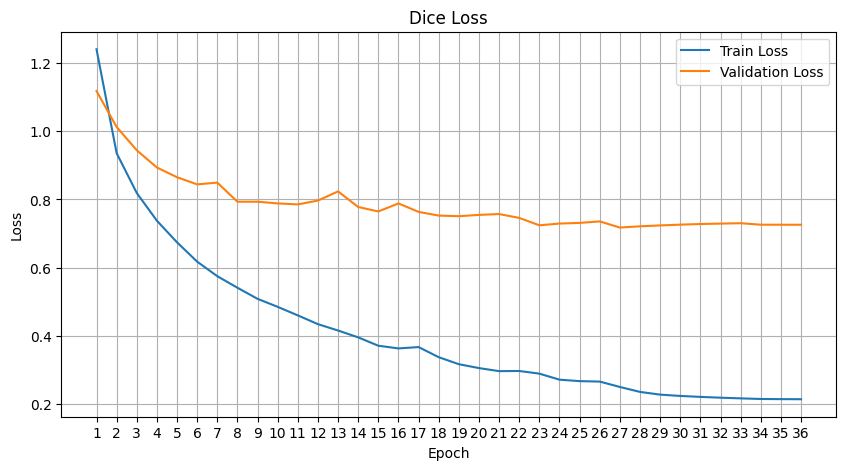

In [14]:
plot_losses(
    dice_loss_epochwise,
    dice_loss_epochwise_val,
    "Dice Loss"
)

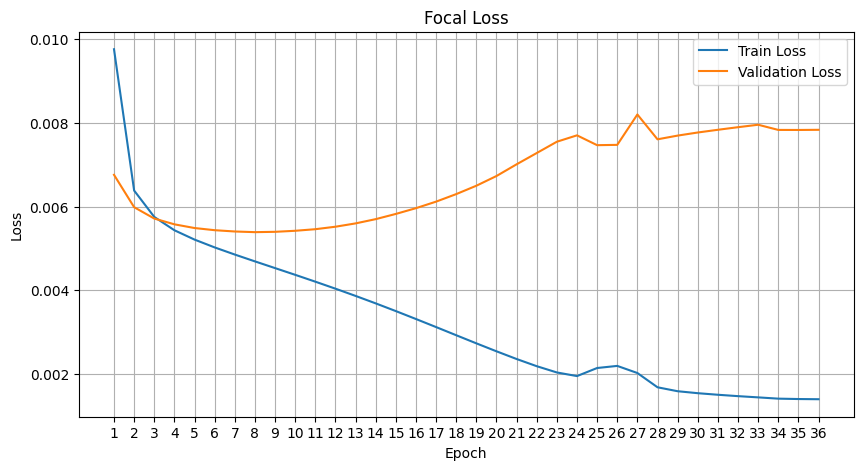

In [15]:
plot_losses(
    focal_loss_epochwise,
    focal_loss_epochwise_val,
    "Focal Loss"
)

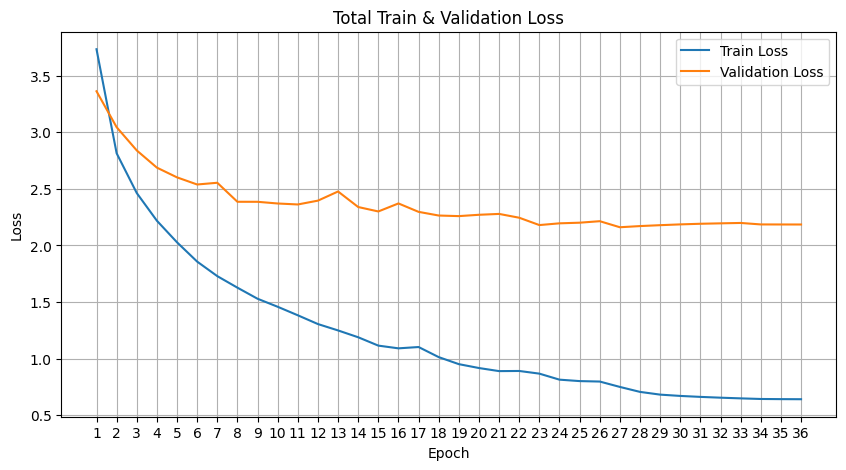

In [16]:
plot_losses(
    train_loss_epochwise,
    val_loss_epochwise,
    "Total Train & Validation Loss"
)

From the training process of the model above, it's evident that early stopping could have been employed before reaching 36 epochs, as performance gains were marginal beyond this point. Additionally, a slight overfitting issue was observed, where the model performed exceptionally well on the training data but may not generalize as effectively to unseen data.

Ideally, enhancing the dataset through augmentation techniques and increasing the batch size to 16 could potentially alleviate overfitting and improve the model’s performance. Unfortunately, due to the constraints imposed by our GPU’s computational capacity, we were compelled to maintain a batch size of 2.

###Inference & Post-Processing

#### Points NMS
Non-max suppression for the category predictions, applied to each channel sperately. A maxpooling with a kernel size of 2, sample code is included below.

#### Concatenation and Sorting
Here, we merge the predictions across all the FPN levels into a single list of predictions, sorted by their predicted score. This involves rescaling the predicted masks appropriately.

#### Matrix NMS
Inspired by Soft-NMS, MatrixNMS suppresses mask predictions with a lower score based on their similarity to predictions with a higher score in a completely vectorized manner. Sample code is include below.

In [17]:
# Credit to SOLO Author's code
# This function does NMS on the heat map (category_prediction), grid-level
# Input:
#     heat: (batch_size, C-1, S, S)
# Output:
#     (batch_size, C-1, S, S)
def points_nms(heat, kernel=2):
    # kernel must be 2
    hmax = F.max_pool2d(
        heat, (kernel, kernel), stride=1, padding=1)
    keep = (hmax[:, :, :-1, :-1] == heat).float()
    return heat * keep

# This function performs Matrix NMS
# Input:
#     sorted_masks: (n_active, image_h/4, image_w/4)
#     sorted_scores: (n_active,)
# Output:
#     decay_scores: (n_active,)
def MatrixNMS(sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay

# For performing nms and thresholding of categ outputs
def point_nms_and_threshold(categ_fpn, categ_thresh):
    """
    Input Shape:
        categ_fpn: B x s x s x c
    """
    categ_nms = points_nms(categ_fpn.permute(0,3,1,2)).permute(0,2,3,1)
    categ_nms_thresh = torch.where(categ_nms >= categ_thresh, categ_nms, 0.0)
    return categ_nms_thresh

In [18]:
def stack_fpn_levelwise(category_fpn, mask_fpn):
    categ_thresh_all = []
    masks_all = []
    for categ_fpn_level in category_fpn:
        flattened_categ_fpn_level = categ_fpn_level.flatten(1, 2)
        categ_thresh_all.append(flattened_categ_fpn_level)
    categ_thresh_all = torch.hstack(categ_thresh_all)

    for mask_fpn_level in mask_fpn:
        masks_all.append(mask_fpn_level)

    masks_all = torch.hstack(masks_all)

    return categ_thresh_all, masks_all


def fetch_img_with_mask(model_checkpoint, filtered_masks, filtered_categories, original_image, alpha=0.5):
    def get_scaled_masks():
        return F.interpolate(
            filtered_masks.unsqueeze(1),
            (model_checkpoint.image_height, model_checkpoint.image_width)
        ).squeeze(1)

# References:
# 1) https://stackoverflow.com/questions/49768306/pytorch-tensor-to-numpy-array

    def get_normalized_image():
        return normalize_numpyarray_plot(
            original_image.permute(1, 2, 0).detach().cpu().numpy()
        )

    def apply_threshold_to_masks(scaled_masks):
        threshold = model_checkpoint.postprocess_cfg['mask_thresh']
        return torch.where(scaled_masks > threshold, 1.0, 0)

    scaled_masks = get_scaled_masks()
    norm_image = get_normalized_image()
    final_masks = apply_threshold_to_masks(scaled_masks)

    return overlay_mask_on_image(norm_image, final_masks, filtered_categories, alpha=alpha)

def get_activations_and_category_grid_cellss(value_matrix, index_matrix, mask_matrix):
    activation_filter = value_matrix > 0
    return (
        value_matrix[activation_filter],
        index_matrix[activation_filter],
        mask_matrix[activation_filter]
    )

def fetch_postprocess_mask(model_checkpoint, val_arr, idx_arr, mask_arr):
    cfg = model_checkpoint.postprocess_cfg
    max_items = min(cfg['pre_NMS_num'], len(val_arr))
    top_idx = val_arr.topk(max_items).indices

    top_vals = val_arr[top_idx]
    top_indices = idx_arr[top_idx]
    filtered_masks = (mask_arr[top_idx] > cfg['mask_thresh']).float()

    selection_idx = MatrixNMS(filtered_masks, top_vals) > cfg['IoU_thresh'] - 0.1

    final_num = min(cfg['keep_instance'], selection_idx.sum().item())
    selected_masks = filtered_masks[selection_idx][:final_num]
    selected_indices = (top_indices[selection_idx] + 1).type(torch.int8).cpu().numpy()[:final_num]

    return selected_masks, selected_indices

def postprocessing_img(input_values, input_indices, input_masks, given_image, model_checkpoint, alpha):

    def retrieve_activated_items():
        activated_values, activated_indices, activated_masks = get_activations_and_category_grid_cellss(input_values, input_indices, input_masks)
        return activated_values, activated_indices, activated_masks

    def perform_postprocessing(activated_values, activated_indices, activated_masks):
        processed_masks, processed_categories = fetch_postprocess_mask(model_checkpoint, activated_values, activated_indices, activated_masks)
        return processed_masks, processed_categories

    def generate_final_output(processed_masks, processed_categories):
        output_image = fetch_img_with_mask(model_checkpoint, processed_masks, processed_categories, given_image, alpha)
        return output_image

    activated_values, activated_indices, activated_masks = retrieve_activated_items()
    processed_masks, processed_categories = perform_postprocessing(activated_values, activated_indices, activated_masks)

    return generate_final_output(processed_masks, processed_categories)

def render_mask_images(model_checkpoint, categ_op, mask_op, imgs):
    cfg = model_checkpoint.postprocess_cfg
    categ_thresh = cfg['categ_thresh']

    def apply_threshold_and_stack():
        thresholded_categ = [
            point_nms_and_threshold(categ, categ_thresh) for categ in categ_op
        ]
        stacked_categ, stacked_masks = stack_fpn_levelwise(
            category_fpn=thresholded_categ, mask_fpn=mask_op
        )
        max_values, max_indices = torch.max(stacked_categ, dim=-1)
        return max_values, max_indices, stacked_masks

    def plot_images(max_values, max_indices, all_masks):
        total_images = min(len(max_values), ncols * nrows)
        for idx in range(total_images):
            final_masked_image = postprocessing_img(
                max_values[idx], max_indices[idx], all_masks[idx], imgs[idx],
                model_checkpoint, alpha=0.4
            )
            ax[idx // ncols, idx % ncols].imshow(final_masked_image)

    max_vals, max_inds, masks = apply_threshold_and_stack()

    ncols, nrows = 2, int(len(max_vals) / 2)
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4.5))

    plot_images(max_vals, max_inds, masks)

Load the saved model

In [19]:
#Function to collate the batches of variable length into a tuple
def collate_fn(batch):
    images, labels, masks, bounding_boxes = list(zip(*batch))
    return torch.stack(images), labels, masks, bounding_boxes

In [20]:
# file path and make a list
folder_path = '/content/drive/MyDrive/cis6800/solo/'
imgs_path = folder_path+ 'hw3_mycocodata_img_comp_zlib.h5'
masks_path = folder_path+ 'hw3_mycocodata_mask_comp_zlib.h5'
labels_path = folder_path+ 'hw3_mycocodata_labels_comp_zlib.npy'
bboxes_path = folder_path+ 'hw3_mycocodata_bboxes_comp_zlib.npy'
paths = [imgs_path, masks_path, labels_path, bboxes_path]
# load the data into data.Dataset
dataset = BuildDataset(paths)
print("Loaded the data into torch.utils.data.Dataset")

# set 20% of the dataset as the training data
full_size = len(dataset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size
# random split the dataset into training and testset
# set seed
torch.random.manual_seed(1)
_, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

Loaded the data into torch.utils.data.Dataset


In [ ]:
del dataset

In [21]:
from torch.utils.data import Subset, DataLoader
batch_size = 4
# Select the images that give us vivid perspectives to make sure that our model works just fine!
image_samples = [68,70,71,86,1,3,4,6,7,8,10,11,88,89,92,96,116,149,151,157]
inference_dataset = Subset(test_dataset, image_samples)
inference_loader = DataLoader(inference_dataset, batch_size=batch_size, collate_fn=collate_fn, shuffle=False)

In [22]:
# load model from epoch 36 (35 here since counting starts from 0)
checkpoint_path = "/content/drive/MyDrive/cis6800/solo/logs2/lightning_logs/version_5/checkpoints/epoch=35-step=47016.ckpt"
SOLO_model = SOLOTrainer().load_from_checkpoint(checkpoint_path).to('cpu')
SOLO_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 47.5MB/s]


SOLOTrainer(
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu): ReLU(inplace=True)
          (downsample): Sequential(
            (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(256,

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(



 Inference batch 1


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


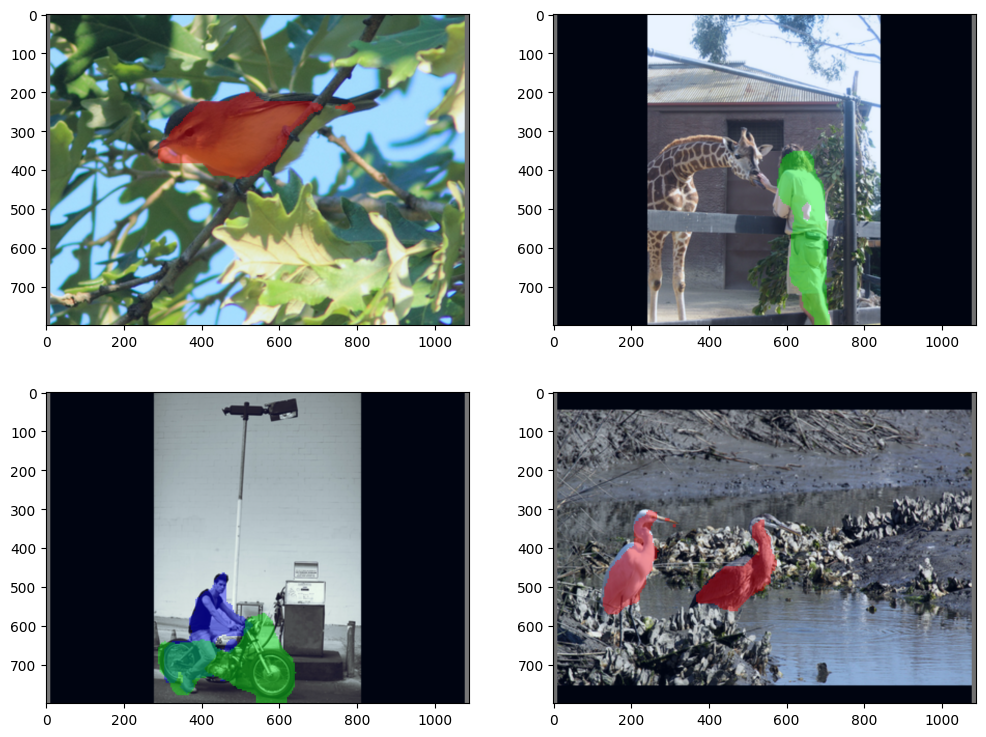


 Inference batch 2


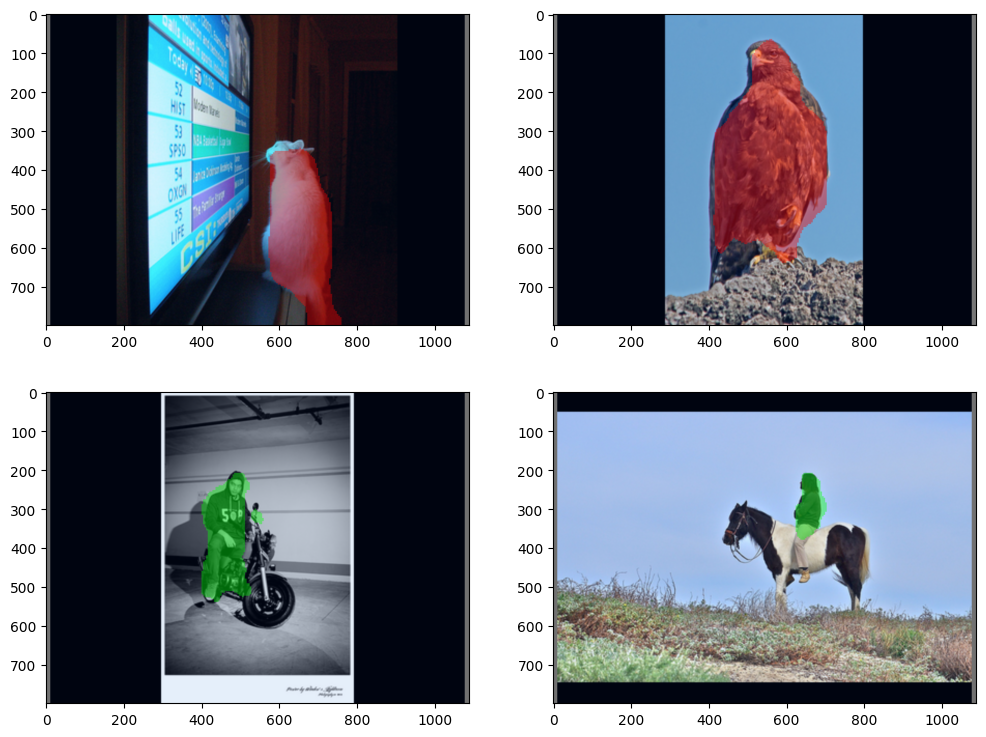


 Inference batch 3


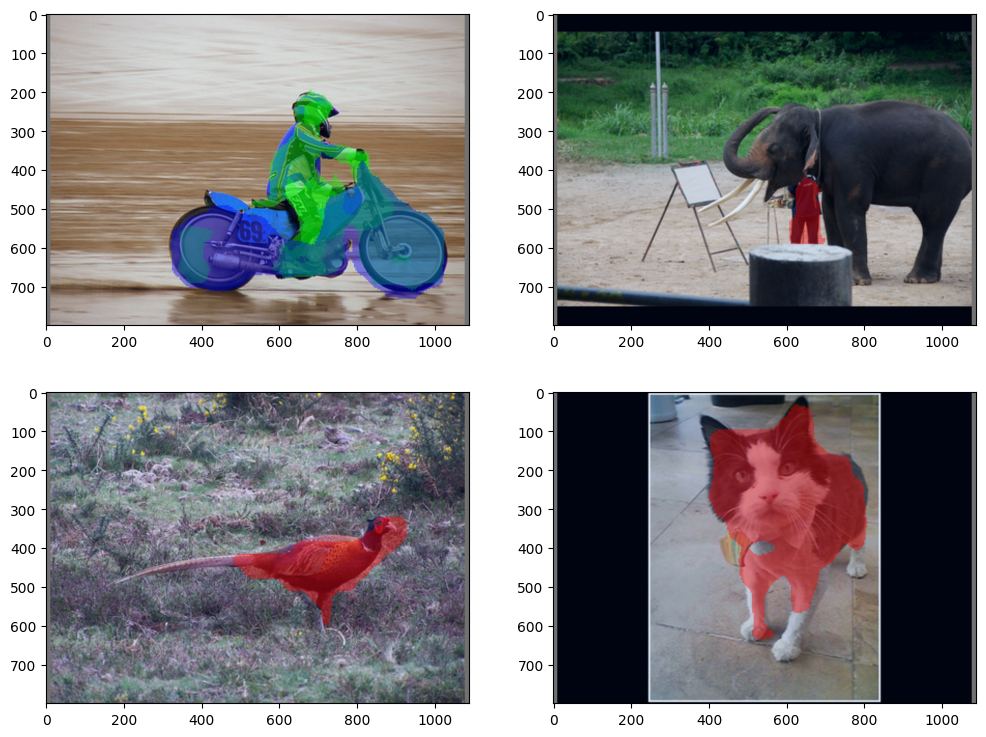


 Inference batch 4


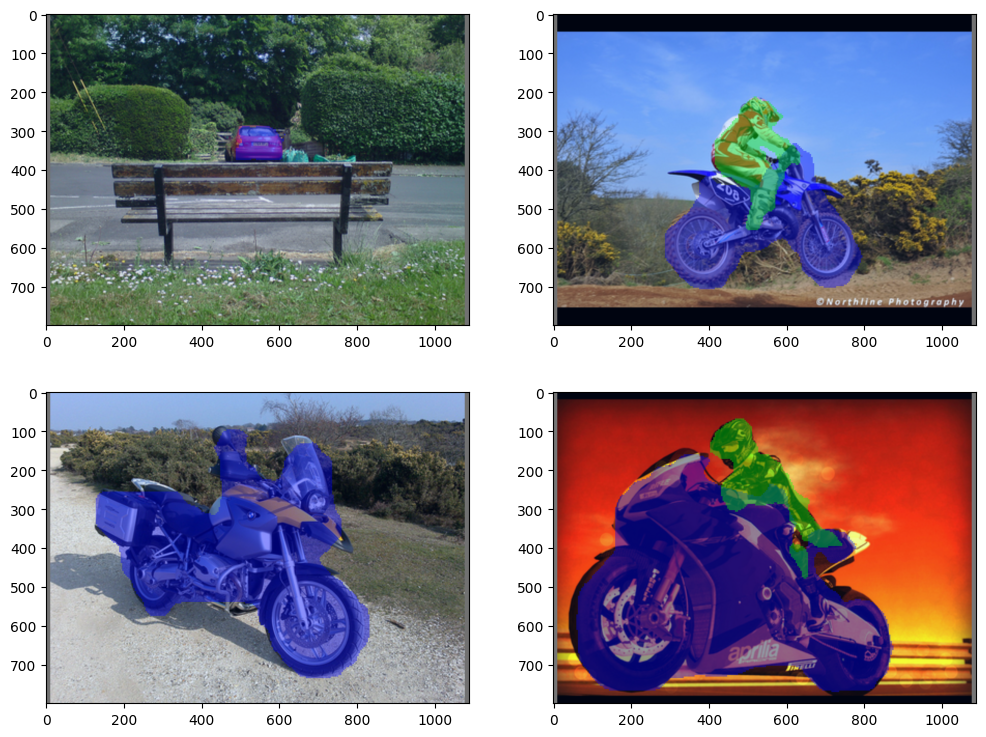


 Inference batch 5


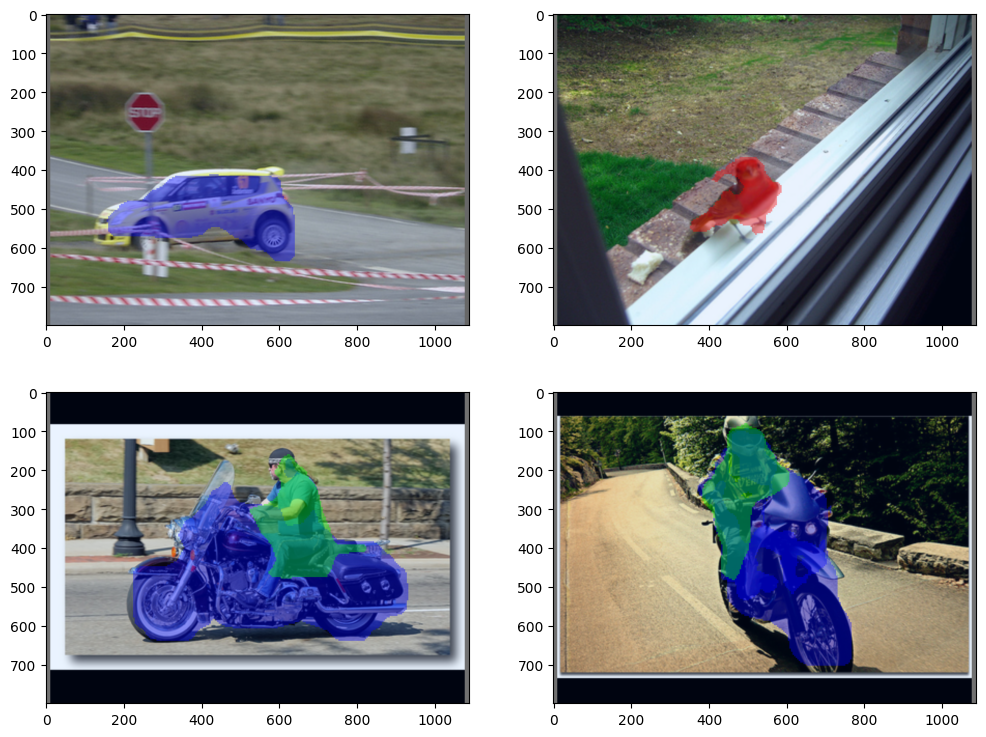

In [23]:
def perform_inference(solo_model, inference_loader):
    batch_index = 1
    for images, labels, masks, bboxes in inference_loader:
        print(f'\n Inference batch {batch_index}')
        with torch.no_grad():
            model_output = solo_model.forward(images, eval=True)
            category_output, mask_output = model_output
            render_mask_images(solo_model, category_output, mask_output, images)
            plt.show()
            plt.close()
            del model_output, category_output, mask_output
            gc.collect()
        batch_index += 1

perform_inference(SOLO_model, inference_loader)

### Part B Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Final inference results such as figs. 11-14. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Training and validation loss curves. These should include the focal loss, dice loss, and total loss as seperate quantities.

In addition, you should include a discussion of any issues you encountered during this project and any changes you made to the siggested architecture. If you made any interesting observations or thoughts about potential improvements, you should also include them here.

* We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.
